# Import Libraries

In [2]:
# General and data processing libraries
import xarray as xr
import numpy as np
from datetime import date
import cftime as cftime
import math
import random
import pandas as pd
import warnings
import astropy
import pickle
import geopy.distance


#Plotting and visualization libraries
import matplotlib
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.dates as mdates
import matplotlib.cbook as cbook
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

import cartopy.crs as ccrs
import cartopy as cartopy
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter



#import statistical and machine learning libraries
import statsmodels.api as sm

import sklearn
from sklearn import preprocessing
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers


warnings.filterwarnings('ignore')


#set up general map formatting
def mapsetup(central=0, minlat=-90,maxlat=90,minlon=-180,maxlon=180, big = False):
    if big: fig=plt.figure(figsize=(15,20))
    else:
        fig=plt.figure(figsize=(5,7))
    plt.rcParams.update({'font.size': 10})
    ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=central), xlim = (-60,60),ylim = (-60,60))
    ax.set_extent([minlon,maxlon,minlat,maxlat], crs=ccrs.PlateCarree())
    ax.add_feature(cartopy.feature.OCEAN, facecolor='aliceblue')
    ax.add_feature(cartopy.feature.LAND, facecolor= 'ivory',edgecolor='lightblue')
    ax.add_feature(cartopy.feature.LAKES, facecolor='aliceblue',edgecolor='lightblue')
    ax.add_feature(cartopy.feature.RIVERS, edgecolor ='aliceblue')
    ax.set_xticks([minlon,minlon/2,0,maxlon/2,maxlon], crs=ccrs.PlateCarree(central_longitude=central))
    ax.set_yticks([minlat,minlat/2,0,maxlat/2,maxlat], crs=ccrs.PlateCarree(central_longitude=central))
    return ax




# open dataset

initial preprocessing of data - only run once

In [ ]:
# # two sets of track models

# #first dataset with 5 ensemble members ('YENS')
# dsAll=xr.open_dataset('/tigress/gvecchi/ANALYSIS/AM2.5_C360/TRAJ_amipHadISST1_chancorr/NETCDF_TRACKS/tracks_NA.nc')

# #second dataset with 3 ensemble members ('YENS')
# dsAll2=xr.open_dataset('/tigress/gvecchi/ANALYSIS/AM2.5_C360/TRAJ_amipHadISST1/NETCDF_TRACKS/tracks_NA.nc')

# #concatenate the two datasets
# dsAll2 = dsAll2.where(dsAll2.YENS<4, drop = True)
# dsAll2= dsAll2.assign_coords(YENS=(dsAll2.YENS + 5))
# dsAll3 = xr.concat(objs = [dsAll,dsAll2], dim = 'YENS')

# #save dsAll3 to its own nc file
# dsAll3.to_netcdf('data.nc')



open datasets from files here:

In [9]:
#storm tracks data
dsAll3=xr.open_dataset('data.nc')

#annual mean temperature data
tempdata = pd.read_csv('graph.csv')


Dataset characteristics: 

ZSTORM1: 
- has size 35
- represents the number of tracks

XCOUNT: 
- has size 120
- represents the points within the track

YRT: 
- years range 1971 to 2019

WIND: 
- ranges around 10-50

YENS: 
- ensemble member identifier 

# Restructure dataset

Here, I restructure the data from an xarray dataset to a dataframe that includes rows corresponding to each data point and a feature space which includes the variables latitude, longitude, wind speed, and SLP from the past two time steps

In [10]:
class structureData: 
    def __init__(self, dsAll, tempdata):
        #full dataset 
        self.dsAll = dsAll
        self.tempdata= tempdata
        
   # method to obtain a dataframe from the Xarray datasets     
    def returnDF(self):
        #iterate through the n ensemble members 
        for n in range(self.dsAll.dims['YENS']):
            
            theList = self.restructure(number=n)
            theArray = np.asarray(theList)
            newArray = []
            for i in theArray:
                newArray.append(i.flatten())
                
            #incorporate annual mean temperature data
            tempdata=self.tempdata
            tempdata = tempdata[tempdata.iloc[:, 0]>=1971]
            tempdata['year']=tempdata.iloc[:,0]
            tempdata['meanTemp']=tempdata.iloc[:,1]
            tempdata=tempdata.iloc[:,3:5]
            
            #construct new dataframe 
            newDF = pd.DataFrame(np.asarray(newArray).T)
            newDF.columns = ['lon', 'wind', 'lat', 'year', 'month','day', 'zSTORM1', 'SLP', 'hour','XCOUNT']
            #add annual mean temperature data to the dataframe 
            merged = pd.merge(newDF, tempdata, how='left', on='year')
            
            #add a column indicating the ensemble member number
            merged['ensemble']= n*np.ones(newDF.shape[0])
            if n ==0: 
                theDF = merged
            else: theDF = theDF.append(merged)
        return theDF
        
 
                
    # helper method to restructure Xarray dataset into lists  
    def restructure(self, number):
            ds = self.dsAll.sel(YENS=number+1).drop('YENS')
            lonsList,  windsList, latsList, yearsList,monthsList,daysList,zSTORM1List,SLP,XCOUNTList,hoursList = ([] for i in range(10)) 

            #each year
            for i in ds['YRT'].values.astype(int):
                #each storm
                for j in ds['ZSTORM1'].values.astype(int):
                    winds = ds['WIND'].sel(YRT=i).sel(ZSTORM1=j).values
                    lats= ds['LAT'].sel(YRT=i).sel(ZSTORM1=j).values
                    #if winds is not all nan
                    if np.sum(np.isnan(winds))!=len(winds):
                        latsList.append(ds['LAT'].sel(YRT=i).sel(ZSTORM1=j).values)
                        lonsList.append(ds['LON'].sel(YRT=i).sel(ZSTORM1=j).values)
                        XCOUNTList.append(np.asarray(range(1,121,1)))
                        windsList.append(ds['WIND'].sel(YRT=i).sel(ZSTORM1=j).values)
                        yearsList.append(ds['YEAR'].sel(YRT=i).sel(ZSTORM1=j).values)
                        hoursList.append(ds['HOUR'].sel(YRT=i).sel(ZSTORM1=j).values)
                        daysList.append(ds['DAY'].sel(YRT=i).sel(ZSTORM1=j).values)
                        monthsList.append(ds['MONTH'].sel(YRT=i).sel(ZSTORM1=j).values)
                        SLP.append(ds['SLP'].sel(YRT=i).sel(ZSTORM1=j).values)
                        zSTORM1List.append(j*np.ones(len(ds['SLP'].sel(YRT=i).sel(ZSTORM1=j).values)))

            return lonsList, windsList, latsList, yearsList, monthsList,daysList, zSTORM1List, SLP, hoursList, XCOUNTList   
    
    #return dataframe with day of year included 
    def AddDay(self):
        merged = self.returnDF()
        dfDate2 = pd.DataFrame({'year': merged['year'].values, 'month': merged['month'].values,'day': merged['day']})
        merged['dayofyr']=self.date_to_nth_day(dfDate2)
        return merged
    
    
    #helper method to get the day of year from a date
    @staticmethod
    def date_to_nth_day(dfDate):
            date = pd.to_datetime(dfDate, format=format)
            daysyr=[]
            for i in range(date.shape[0]):
                try: 
                    theDate=date.iloc[i]
                    new_year_day = pd.Timestamp(year=theDate.year, month=1, day=1)
                    daysyr.append((theDate - new_year_day).days + 1)
                except TypeError: 
                    daysyr.append(np.nan)
            return daysyr
        
        
        
        
    #restructure the data for the autoregressive model   
    def for_regression(self):
        merged= self.AddDay()
        rows = []
        lats = []
        lons=[]
        SLPs = []
        winds = []
        # build a dataframe where each row contains the variables 
        #from one timestep before and two timesteps before
        
        for i in range(merged.shape[0]):
            #account for first two points in any storm
            if merged['XCOUNT'].values[i]==1:
                twobefore = merged.iloc[i,:].values

            elif merged['XCOUNT'].values[i]==2:
                onebefore = merged.iloc[i,:].values
            
            else: 
                if twobefore.shape[0] !=1:
                    #build feature space
                    rows.append(np.concatenate((twobefore,onebefore),axis = None))
                    
                    #build y variables
                    lats.append(merged['lat'].values[i])
                    lons.append(merged['lon'].values[i])
                    SLPs.append(merged['SLP'].values[i])
                    winds.append(merged['wind'].values[i])
                # case of a nan row
                if np.isnan(merged.iloc[i,:].values[0]):
                    twobefore = np.asarray([0])
                    onebefore = np.asarray([0])
                    
                    
                # to be added in next iteration
                else: 
                    twobefore = onebefore
                    onebefore = merged.iloc[i,:].values
        #convert to dataframe 
        lats = np.asarray(lats)       
        lons = np.asarray(lons)   
        df5=pd.DataFrame(np.asarray(rows))
        df5.columns = ['lon2', 'wind2', 'lat2', 'year2', 'month2','day2', 'zSTORM12', 'SLP2', 'hour2','XCOUNT2','meanTemp2','ensemble2','dayofyr2',  'lon', 'wind', 'lat', 'year', 'month','day', 'zSTORM1', 'SLP', 'hour','XCOUNT','meanTemp','ensemble','dayofyr']
        #add in y variables 
        df5['ylat']=lats
        df5['ylon']=lons
        df5['ywind']=winds
        df5['ySLP']= SLPs
        df5=df5.dropna()
        return df5
        
        


               
        

# Run Regression Model  with mean temperature anomaly
Run 4 regressions to predict the variables of latitude, longitude, wind, and SLP. The feature space for these regressions includes latitude, longitude, wind, and SLP from the two previous time steps (6 hours and 12 hours before), along with global mean temperature anomaly, the position in the storm (XCOUNT), an intercept, and second order interaction terms between the latitude and longitude variables. 




In [11]:
#construct a dataframe structured for the regression from the dataset 
theData1 = structureData(dsAll3, tempdata)
df5= theData1.for_regression()


In [12]:
#variables to be kept for the regression
X= df5[['lon2', 'wind2', 'lat2', 'SLP2', 'lon', 'wind', 'lat', 'SLP', 'XCOUNT','meanTemp']]
X = sm.add_constant(X)
oldX=X.copy()

#add second degree interaction features for lat and lon
poly=PolynomialFeatures(degree=2,include_bias = False, interaction_only=True)
Xpoly=poly.fit_transform(X[['lat','lon','lat2','lon2']])
Xpoly =pd.DataFrame(Xpoly, columns = poly.get_feature_names(['lat','lon','lat2','lon2']))
Xpoly=Xpoly.iloc[:,4:]
X = pd.concat([X.reset_index(), Xpoly.reset_index()], axis=1, sort=False)
X=X.drop(labels='index',axis =1)



In [13]:
#run 4 regressions for each of lat, lon, SLP, and wind 
#include the annual mean temp variable 
modelLat = sm.OLS(df5['ylat'].values,X).fit(cov_type='HC0')
modelLon = sm.OLS(df5['ylon'].values,X).fit(cov_type='HC0')
modelSLP = sm.OLS(df5['ySLP'].values,X).fit(cov_type='HC0')
modelwind = sm.OLS(df5['ywind'].values,X).fit(cov_type='HC0')

In [14]:
modelLat.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                 2.407e+06
Date:                Tue, 08 Dec 2020   Prob (F-statistic):               0.00
Time:                        13:12:55   Log-Likelihood:            -1.2576e+05
No. Observations:              131874   AIC:                         2.515e+05
Df Residuals:                  131857   BIC:                         2.517e+05
Df Model:                          16                                         
Covariance Type:                  HC0                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.6212      0.367      1.694      0.090      -0.097       1.340
lon2          -0.1454      0.007    -21.297      0.000      -0.159      -0.132
wind2         -0.0023      0.001     -3.053      0.002      -0.004      -0.001
lat2          -0.9953      0.063    -15.900      0.000      -1.118      -0.873
SLP2          -0.0088      0.001    -15.494      0.000      -0.010      -0.008
lon            0.1400      0.007     20.301      0.000       0.127       0.154
wind           0.0103      0.001     13.777      0.000       0.009       0.012
lat            2.0024      0.062     32.254      0.000       1.881       2.124
SLP            0.0090      0.001     15.526      0.000       0.008       0.010
XCOUNT        -0.0010      0.000     -7.468      0.000      -0.001      -0.001
meanTemp      -0.0082      0.006     -1.285      0.199      -0.021       0.004
lat lon        0.0173      0.002      7.089      0.000       0.013       0.022
lat lat2     7.73e-05    1.6e-05      4.837      0.000     4.6e-05       0.000
lat lon2      -0.0185      0.002     -7.423      0.000      -0.023      -0.014
lon lat2      -0.0191      0.002     -7.834      0.000      -0.024      -0.014
lon lon2    1.133e-05   3.53e-06      3.211      0.001    4.41e-06    1.82e-05
lat2 lon2      0.0202      0.002      8.134      0.000       0.015       0.025
==============================================================================
Omnibus:                    34024.578   Durbin-Watson:                   2.180
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1315745.846
Skew:                           0.529   Prob(JB):                         0.00
Kurtosis:                      18.438   Cond. No.                     1.59e+07
==============================================================================

Warnings:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 1.59e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [15]:
modelLon.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                 3.423e+06
Date:                Tue, 08 Dec 2020   Prob (F-statistic):               0.00
Time:                        13:12:55   Log-Likelihood:            -2.0389e+05
No. Observations:              131874   AIC:                         4.078e+05
Df Residuals:                  131857   BIC:                         4.080e+05
Df Model:                          16                                         
Covariance Type:                  HC0                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -9.5426      1.244     -7.669      0.000     -11.981      -7.104
lon2          -0.9179      0.026    -35.952      0.000      -0.968      -0.868
wind2          0.0102      0.001      6.832      0.000       0.007       0.013
lat2          -1.2469      0.127     -9.804      0.000      -1.496      -0.998
SLP2          -0.0046      0.001     -4.241      0.000      -0.007      -0.002
lon            1.9355      0.026     74.527      0.000       1.885       1.986
wind           0.0054      0.001      3.802      0.000       0.003       0.008
lat            1.2426      0.126      9.895      0.000       0.996       1.489
SLP            0.0108      0.001     10.470      0.000       0.009       0.013
XCOUNT        -0.0004      0.000     -1.644      0.100      -0.001    8.19e-05
meanTemp       0.0158      0.012      1.374      0.170      -0.007       0.038
lat lon        0.0274      0.007      3.745      0.000       0.013       0.042
lat lat2    7.995e-06   6.85e-05      0.117      0.907      -0.000       0.000
lat lon2      -0.0319      0.007     -4.299      0.000      -0.046      -0.017
lon lat2      -0.0316      0.007     -4.220      0.000      -0.046      -0.017
lon lon2   -3.021e-05   1.53e-05     -1.968      0.049   -6.03e-05   -1.24e-07
lat2 lon2      0.0361      0.008      4.764      0.000       0.021       0.051
==============================================================================
Omnibus:                    77413.342   Durbin-Watson:                   2.247
Prob(Omnibus):                  0.000   Jarque-Bera (JB):        113037081.114
Skew:                           1.290   Prob(JB):                         0.00
Kurtosis:                     146.406   Cond. No.                     1.59e+07
==============================================================================

Warnings:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 1.59e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [16]:
modelSLP.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.951
Model:                            OLS   Adj. R-squared:                  0.951
Method:                 Least Squares   F-statistic:                 1.101e+05
Date:                Tue, 08 Dec 2020   Prob (F-statistic):               0.00
Time:                        13:12:55   Log-Likelihood:            -3.6994e+05
No. Observations:              131874   AIC:                         7.399e+05
Df Residuals:                  131857   BIC:                         7.401e+05
Df Model:                          16                                         
Covariance Type:                  HC0                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         34.1887      1.830     18.683      0.000      30.602      37.775
lon2           0.0402      0.022      1.854      0.064      -0.002       0.083
wind2          0.0318      0.005      6.412      0.000       0.022       0.042
lat2          -0.4835      0.152     -3.177      0.001      -0.782      -0.185
SLP2          -0.1254      0.005    -25.239      0.000      -0.135      -0.116
lon           -0.1885      0.022     -8.709      0.000      -0.231      -0.146
wind          -0.0182      0.005     -3.473      0.001      -0.028      -0.008
lat            0.8545      0.150      5.704      0.000       0.561       1.148
SLP            1.1069      0.005    217.351      0.000       1.097       1.117
XCOUNT         0.0161      0.001     24.057      0.000       0.015       0.017
meanTemp      -0.0935      0.040     -2.311      0.021      -0.173      -0.014
lat lon       -0.0365      0.006     -6.573      0.000      -0.047      -0.026
lat lat2       0.0008    6.5e-05     12.040      0.000       0.001       0.001
lat lon2       0.0330      0.006      5.817      0.000       0.022       0.044
lon lat2       0.0369      0.006      6.543      0.000       0.026       0.048
lon lon2       0.0003   1.45e-05     20.514      0.000       0.000       0.000
lat2 lon2     -0.0345      0.006     -6.001      0.000      -0.046      -0.023
==============================================================================
Omnibus:                    17282.917   Durbin-Watson:                   2.035
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            90602.205
Skew:                          -0.529   Prob(JB):                         0.00
Kurtosis:                       6.920   Cond. No.                     1.59e+07
==============================================================================

Warnings:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 1.59e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [17]:
modelwind.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.858
Model:                            OLS   Adj. R-squared:                  0.858
Method:                 Least Squares   F-statistic:                 3.114e+04
Date:                Tue, 08 Dec 2020   Prob (F-statistic):               0.00
Time:                        13:12:55   Log-Likelihood:            -3.4779e+05
No. Observations:              131874   AIC:                         6.956e+05
Df Residuals:                  131857   BIC:                         6.958e+05
Df Model:                          16                                         
Covariance Type:                  HC0                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         51.1967      1.682     30.442      0.000      47.900      54.493
lon2          -0.1459      0.020     -7.142      0.000      -0.186      -0.106
wind2          0.2111      0.005     42.359      0.000       0.201       0.221
lat2          -0.4397      0.147     -2.998      0.003      -0.727      -0.152
SLP2           0.1878      0.004     48.033      0.000       0.180       0.195
lon            0.3245      0.021     15.799      0.000       0.284       0.365
wind           0.5838      0.005    106.838      0.000       0.573       0.594
lat            0.1074      0.144      0.744      0.457      -0.175       0.390
SLP           -0.2559      0.004    -63.230      0.000      -0.264      -0.248
XCOUNT        -0.0070      0.001    -11.815      0.000      -0.008      -0.006
meanTemp       0.1241      0.034      3.641      0.000       0.057       0.191
lat lon       -0.0370      0.005     -8.156      0.000      -0.046      -0.028
lat lat2      -0.0010   5.95e-05    -16.533      0.000      -0.001      -0.001
lat lon2       0.0368      0.005      7.902      0.000       0.028       0.046
lon lat2       0.0336      0.005      7.445      0.000       0.025       0.042
lon lon2      -0.0003   1.61e-05    -20.980      0.000      -0.000      -0.000
lat2 lon2     -0.0323      0.005     -6.981      0.000      -0.041      -0.023
==============================================================================
Omnibus:                    11258.678   Durbin-Watson:                   2.038
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            67584.957
Skew:                           0.161   Prob(JB):                         0.00
Kurtosis:                       6.492   Cond. No.                     1.59e+07
==============================================================================

Warnings:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 1.59e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

# Run Regression Model  without mean temperature anomaly
Another set of 4 regressions to run in the same way to predict latitude, longitude, wind, and SLP based on the same feature space as above, but excluding the global mean temperature anomaly. This is to assess the difference in performance of a predictive model trained with or without global mean temperature anomaly, which represents climate change over this period of time. 


In [18]:
#run 4 regressions for each of lat, lon, SLP, and wind 
#exclude the annual mean temp variable 
modelLat2 = sm.OLS(df5['ylat'].values,X.drop(labels='meanTemp', axis = 1)).fit(cov_type='HC0')
modelLon2 = sm.OLS(df5['ylon'].values,X.drop(labels='meanTemp', axis = 1)).fit(cov_type='HC0')
modelSLP2 = sm.OLS(df5['ySLP'].values,X.drop(labels='meanTemp', axis = 1)).fit(cov_type='HC0')
modelwind2 = sm.OLS(df5['ywind'].values,X.drop(labels='meanTemp', axis = 1)).fit(cov_type='HC0')




In [19]:
modelLat2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                 2.565e+06
Date:                Tue, 08 Dec 2020   Prob (F-statistic):               0.00
Time:                        13:12:56   Log-Likelihood:            -1.2576e+05
No. Observations:              131874   AIC:                         2.515e+05
Df Residuals:                  131858   BIC:                         2.517e+05
Df Model:                          15                                         
Covariance Type:                  HC0                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.6206      0.367      1.693      0.091      -0.098       1.339
lon2          -0.1453      0.007    -21.292      0.000      -0.159      -0.132
wind2         -0.0023      0.001     -3.063      0.002      -0.004      -0.001
lat2          -0.9954      0.063    -15.901      0.000      -1.118      -0.873
SLP2          -0.0088      0.001    -15.497      0.000      -0.010      -0.008
lon            0.1400      0.007     20.298      0.000       0.126       0.154
wind           0.0103      0.001     13.768      0.000       0.009       0.012
lat            2.0026      0.062     32.255      0.000       1.881       2.124
SLP            0.0090      0.001     15.525      0.000       0.008       0.010
XCOUNT        -0.0010      0.000     -7.523      0.000      -0.001      -0.001
lat lon        0.0173      0.002      7.090      0.000       0.013       0.022
lat lat2      7.7e-05    1.6e-05      4.817      0.000    4.57e-05       0.000
lat lon2      -0.0185      0.002     -7.425      0.000      -0.023      -0.014
lon lat2      -0.0191      0.002     -7.836      0.000      -0.024      -0.014
lon lon2    1.132e-05   3.53e-06      3.207      0.001     4.4e-06    1.82e-05
lat2 lon2      0.0202      0.002      8.136      0.000       0.015       0.025
==============================================================================
Omnibus:                    34024.297   Durbin-Watson:                   2.180
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1315984.143
Skew:                           0.529   Prob(JB):                         0.00
Kurtosis:                      18.440   Cond. No.                     1.59e+07
==============================================================================

Warnings:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 1.59e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [20]:
modelLon2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                 3.651e+06
Date:                Tue, 08 Dec 2020   Prob (F-statistic):               0.00
Time:                        13:12:56   Log-Likelihood:            -2.0389e+05
No. Observations:              131874   AIC:                         4.078e+05
Df Residuals:                  131858   BIC:                         4.080e+05
Df Model:                          15                                         
Covariance Type:                  HC0                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -9.5415      1.244     -7.668      0.000     -11.980      -7.103
lon2          -0.9180      0.026    -35.953      0.000      -0.968      -0.868
wind2          0.0103      0.001      6.840      0.000       0.007       0.013
lat2          -1.2466      0.127     -9.803      0.000      -1.496      -0.997
SLP2          -0.0046      0.001     -4.238      0.000      -0.007      -0.002
lon            1.9356      0.026     74.528      0.000       1.885       1.986
wind           0.0055      0.001      3.813      0.000       0.003       0.008
lat            1.2424      0.126      9.894      0.000       0.996       1.489
SLP            0.0108      0.001     10.471      0.000       0.009       0.013
XCOUNT        -0.0004      0.000     -1.594      0.111      -0.001    9.48e-05
lat lon        0.0274      0.007      3.744      0.000       0.013       0.042
lat lat2    8.583e-06   6.85e-05      0.125      0.900      -0.000       0.000
lat lon2      -0.0319      0.007     -4.298      0.000      -0.046      -0.017
lon lat2      -0.0316      0.007     -4.219      0.000      -0.046      -0.017
lon lon2   -3.017e-05   1.53e-05     -1.966      0.049   -6.03e-05   -9.26e-08
lat2 lon2      0.0361      0.008      4.763      0.000       0.021       0.051
==============================================================================
Omnibus:                    77419.304   Durbin-Watson:                   2.247
Prob(Omnibus):                  0.000   Jarque-Bera (JB):        113034446.673
Skew:                           1.290   Prob(JB):                         0.00
Kurtosis:                     146.404   Cond. No.                     1.59e+07
==============================================================================

Warnings:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 1.59e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [21]:
modelSLP2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.951
Model:                            OLS   Adj. R-squared:                  0.951
Method:                 Least Squares   F-statistic:                 1.174e+05
Date:                Tue, 08 Dec 2020   Prob (F-statistic):               0.00
Time:                        13:12:56   Log-Likelihood:            -3.6994e+05
No. Observations:              131874   AIC:                         7.399e+05
Df Residuals:                  131858   BIC:                         7.401e+05
Df Model:                          15                                         
Covariance Type:                  HC0                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         34.1821      1.830     18.678      0.000      30.595      37.769
lon2           0.0403      0.022      1.861      0.063      -0.002       0.083
wind2          0.0317      0.005      6.396      0.000       0.022       0.041
lat2          -0.4849      0.152     -3.186      0.001      -0.783      -0.187
SLP2          -0.1254      0.005    -25.243      0.000      -0.135      -0.116
lon           -0.1886      0.022     -8.714      0.000      -0.231      -0.146
wind          -0.0183      0.005     -3.491      0.000      -0.029      -0.008
lat            0.8558      0.150      5.712      0.000       0.562       1.149
SLP            1.1069      0.005    217.353      0.000       1.097       1.117
XCOUNT         0.0160      0.001     23.990      0.000       0.015       0.017
lat lon       -0.0365      0.006     -6.564      0.000      -0.047      -0.026
lat lat2       0.0008    6.5e-05     11.993      0.000       0.001       0.001
lat lon2       0.0329      0.006      5.808      0.000       0.022       0.044
lon lat2       0.0368      0.006      6.534      0.000       0.026       0.048
lon lon2       0.0003   1.45e-05     20.509      0.000       0.000       0.000
lat2 lon2     -0.0345      0.006     -5.992      0.000      -0.046      -0.023
==============================================================================
Omnibus:                    17297.136   Durbin-Watson:                   2.035
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            90699.181
Skew:                          -0.529   Prob(JB):                         0.00
Kurtosis:                       6.922   Cond. No.                     1.59e+07
==============================================================================

Warnings:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 1.59e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [22]:
modelwind2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.858
Model:                            OLS   Adj. R-squared:                  0.858
Method:                 Least Squares   F-statistic:                 3.320e+04
Date:                Tue, 08 Dec 2020   Prob (F-statistic):               0.00
Time:                        13:12:56   Log-Likelihood:            -3.4779e+05
No. Observations:              131874   AIC:                         6.956e+05
Df Residuals:                  131858   BIC:                         6.958e+05
Df Model:                          15                                         
Covariance Type:                  HC0                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         51.2055      1.682     30.448      0.000      47.909      54.502
lon2          -0.1461      0.020     -7.151      0.000      -0.186      -0.106
wind2          0.2112      0.005     42.391      0.000       0.201       0.221
lat2          -0.4378      0.147     -2.985      0.003      -0.725      -0.150
SLP2           0.1878      0.004     48.042      0.000       0.180       0.195
lon            0.3247      0.021     15.803      0.000       0.284       0.365
wind           0.5839      0.005    106.881      0.000       0.573       0.595
lat            0.1056      0.144      0.732      0.464      -0.177       0.388
SLP           -0.2559      0.004    -63.229      0.000      -0.264      -0.248
XCOUNT        -0.0069      0.001    -11.658      0.000      -0.008      -0.006
lat lon       -0.0370      0.005     -8.170      0.000      -0.046      -0.028
lat lat2      -0.0010   5.94e-05    -16.467      0.000      -0.001      -0.001
lat lon2       0.0369      0.005      7.917      0.000       0.028       0.046
lon lat2       0.0337      0.005      7.460      0.000       0.025       0.042
lon lon2      -0.0003   1.61e-05    -20.978      0.000      -0.000      -0.000
lat2 lon2     -0.0324      0.005     -6.997      0.000      -0.042      -0.023
==============================================================================
Omnibus:                    11269.870   Durbin-Watson:                   2.038
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            67677.449
Skew:                           0.162   Prob(JB):                         0.00
Kurtosis:                       6.495   Cond. No.                     1.59e+07
==============================================================================

Warnings:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 1.59e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [175]:
# export regression tables to Latex files
#code adapted from: https://economics.stackexchange.com/questions/11774/outputting-regressions-as-table-in-python-similar-to-outreg-in-stata
names = ['modelLat','modelLon', 'modelSLP','modelwind','modelLat2','modelLon2', 'modelSLP2','modelwind2']

count = 0
for model in [modelLat,modelLon, modelSLP,modelwind,modelLat2,modelLon2, modelSLP2,modelwind2]:
    
    beginningtex = """\\documentclass{report}
    \\usepackage{booktabs}
    \\begin{document}"""
    endtex = "\end{document}"

    f = open(names[count]+'reg.tex', 'w')
    f.write(beginningtex)
    f.write(model.summary().as_latex())
    f.write(endtex)
    f.close()
    count+=1

# Generate Predicted Tracks
Predicted tracks are constructed using information about the first two points in each storm in the dataset. The predicted tracks were thus “anchored” at the true genesis location of the storm, and the next data point is predicted using these models. Once the third data point is predicted, the fourth can be predicted based on the second given point and the third predicted point. This method is used to iteratively predict the movement of the storm tracks (given their start location and length). 

In [75]:
#predict tracks based off of model and x data using the first two points of each storm only

def predictPoly2(X, modelLon,modelwind,modelLat,modelSLP):
    
    #list of all predicted points
    X_pred = []
    for i in range(X.shape[0]):
        
        #case of the first 'predicted' point in a storm - it is taken as given
        if X['XCOUNT'].values[i]==X['XCOUNT'][0]:
            firstPoint = list(X.iloc[i,:].values)
            X_pred.append(firstPoint)

        else: 
            #constant and two timestep before data points already known
            const = X_pred[-1][0]
            lon2 = X_pred[-1][5]
            wind2= X_pred[-1][6]
            lat2= X_pred[-1][7]
            SLP2= X_pred[-1][8]
            
            
            #model predictions for lon, wind, lat, and SLP
            a = np.asarray(X_pred[-1]).reshape(1,-1)
            lon = modelLon.predict(a)[0]
  
            wind = modelwind.predict(a)[0]
    
            lat = modelLat.predict(a)[0]
           
            SLP = modelSLP.predict(a)[0]
 
            #increment XCOUNT and keep mean temp the same 
            XCOUNT = X_pred[-1][9]+1
            meanTemp = X_pred[-1][10]
            
            #append to X_pred and add a polynomial transform for second degree features
            toAppend = np.asarray([const,lon2,wind2,lat2,SLP2,lon,wind,lat,SLP,XCOUNT,meanTemp])
            toTransform = np.asarray([lat,lon,lat2,lon2]).reshape(1,-1)
            transformed =np.asarray(poly.fit_transform(toTransform)[0][4:])
  
            X_pred.append(list(toAppend)+list(transformed))
    
    #return a dataframe of predicted tracks generated based off the model
    predicted = pd.DataFrame(X_pred)
    predicted.columns = X.columns
    predicted['year']= df5['year'].values[0:predicted.shape[0]]
    predicted['ensemble']=df5['ensemble'].values[0:predicted.shape[0]]
    return predicted

In [140]:
#predicted tracks
predicted = predictPoly2(X,modelLon,modelwind,modelLat,modelSLP)



# visualize predicted tracks

In [141]:
def plot_tracks(predicted, df5):
    #first ensemble member only 
    number = 0
    for year in range(1971,2020,1):


        #first plot - the actual data for each year
        plt.figure()
        ax=mapsetup(minlat=-10,maxlat=90,minlon=-120,maxlon=30)

        #only keep given year and ensemble member data
        dfdropyr = df5[df5['year']==year]
        dfdropyr = dfdropyr[dfdropyr['ensemble']==number]

        axins1 = inset_axes(ax,width="3%",height="100%", loc='lower left',
                                       bbox_to_anchor=(1.02, 0., 1, 1),
                                       bbox_transform=ax.transAxes,borderpad=0) 

        plt.title('year = ' + str(year)+' dataset = '+str(number))


        lats = dfdropyr['lat2']
        lons = dfdropyr['lon2']
        winds = dfdropyr['wind2']

        #color the scatter plots by wind speed
        a=ax.scatter(lons, lats, c=winds, 
                               cmap= 'rainbow', vmin = 10, vmax = 50,s= 2)
        plt.colorbar(a,axins1, ticks = (10,50))




        #second plot - the predicted tracks for each year
        plt.figure()
        ax=mapsetup(minlat=-10,maxlat=90,minlon=-120,maxlon=30)

        #only keep given year and ensemble member data
        dfpreddropyr= predicted[predicted['year']==year]
        dfpreddropyr = dfpreddropyr[dfpreddropyr['ensemble']==number]


        axins2 = inset_axes(ax,width="3%",height="100%", loc='lower left',
                                       bbox_to_anchor=(1.02, 0., 1, 1),
                                       bbox_transform=ax.transAxes,borderpad=0) 
        plt.title('year = ' + str(year)+' dataset = '+str(number)+' predicted')

        #predicted coordinates
        latsp = dfpreddropyr['lat2']
        lonsp = dfpreddropyr['lon2']
        windsp = dfpreddropyr['wind2']
        #color the scatter plots by wind speed
        b = ax.scatter(lonsp, latsp, c=windsp, 
                               cmap= 'rainbow', vmin = 10, vmax = 50,s= 2)
        plt.colorbar(b,axins2, ticks = (10,50))

<Figure size 432x288 with 0 Axes>

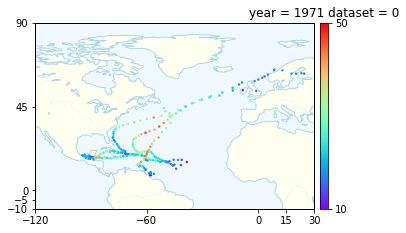

<Figure size 432x288 with 0 Axes>

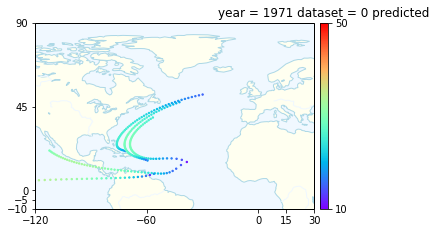

<Figure size 432x288 with 0 Axes>

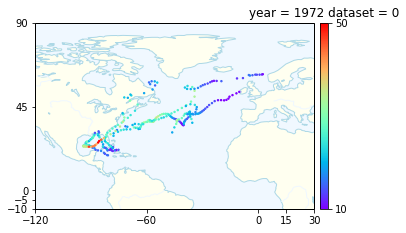

<Figure size 432x288 with 0 Axes>

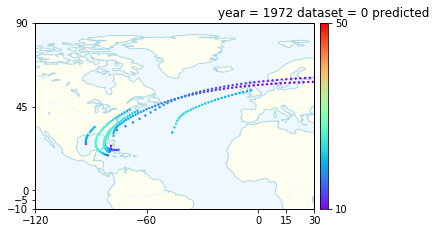

<Figure size 432x288 with 0 Axes>

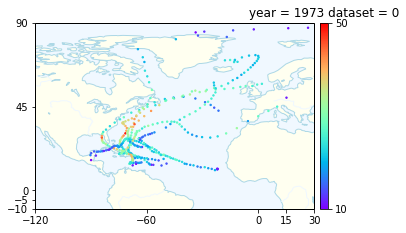

<Figure size 432x288 with 0 Axes>

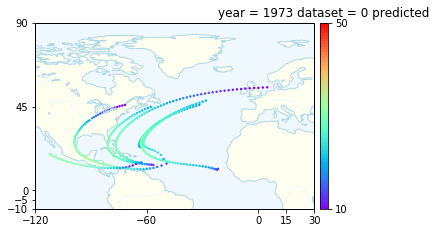

<Figure size 432x288 with 0 Axes>

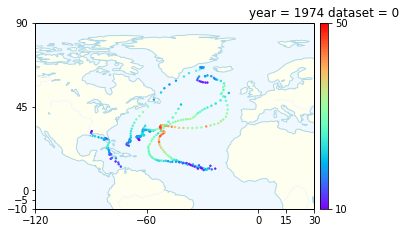

<Figure size 432x288 with 0 Axes>

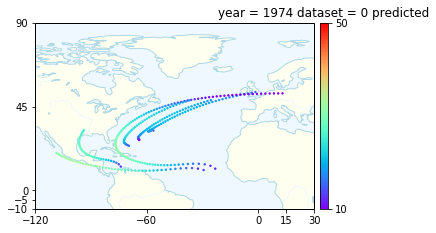

<Figure size 432x288 with 0 Axes>

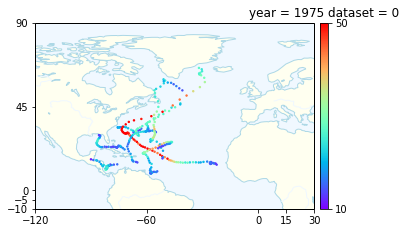

<Figure size 432x288 with 0 Axes>

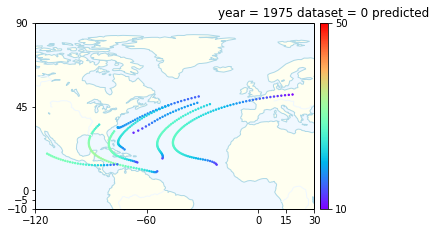

<Figure size 432x288 with 0 Axes>

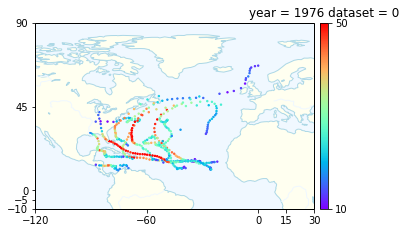

<Figure size 432x288 with 0 Axes>

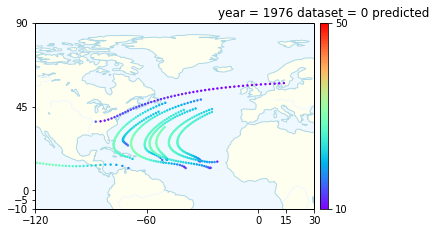

<Figure size 432x288 with 0 Axes>

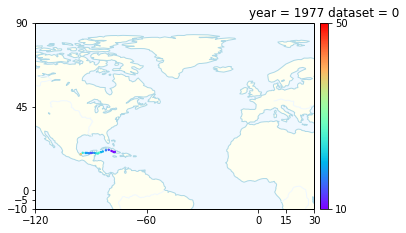

<Figure size 432x288 with 0 Axes>

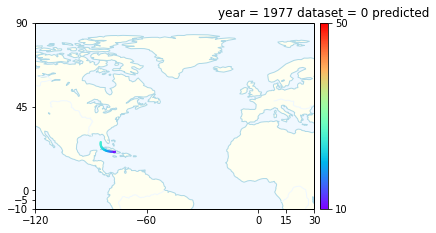

<Figure size 432x288 with 0 Axes>

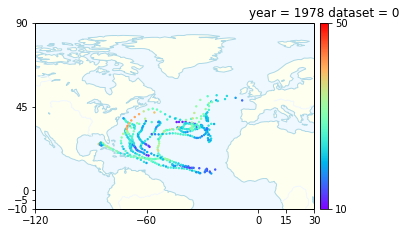

<Figure size 432x288 with 0 Axes>

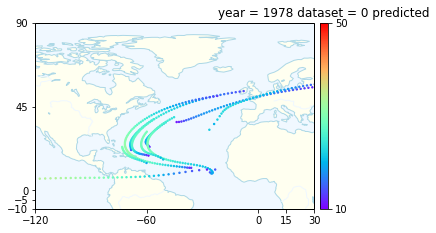

<Figure size 432x288 with 0 Axes>

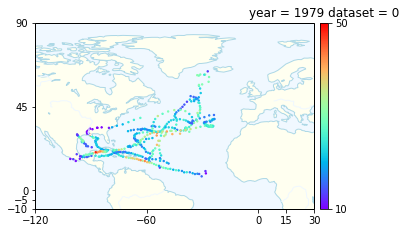

<Figure size 432x288 with 0 Axes>

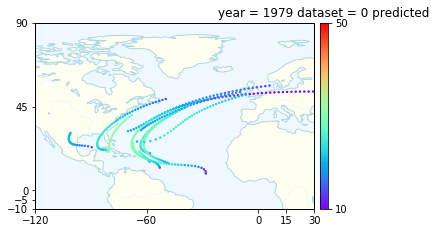

<Figure size 432x288 with 0 Axes>

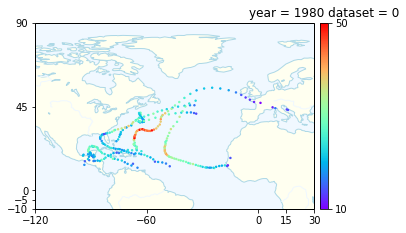

<Figure size 432x288 with 0 Axes>

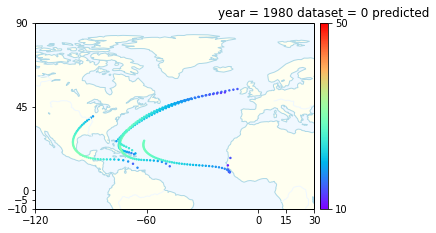

<Figure size 432x288 with 0 Axes>

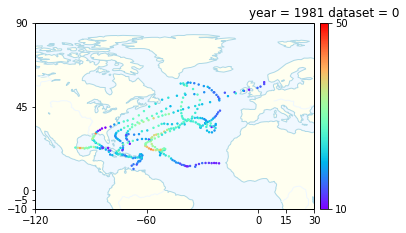

<Figure size 432x288 with 0 Axes>

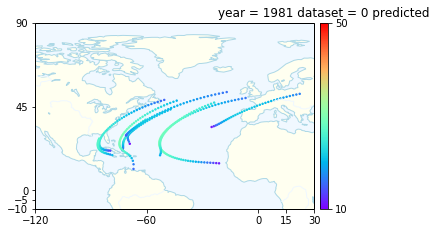

<Figure size 432x288 with 0 Axes>

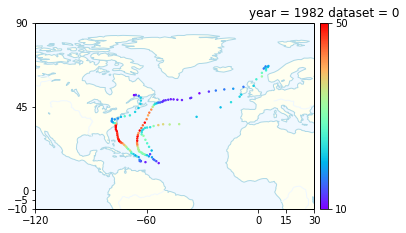

<Figure size 432x288 with 0 Axes>

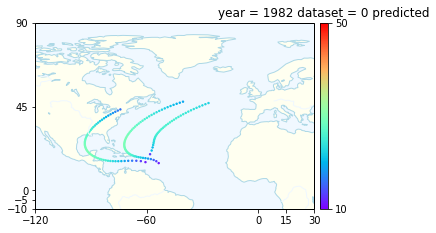

<Figure size 432x288 with 0 Axes>

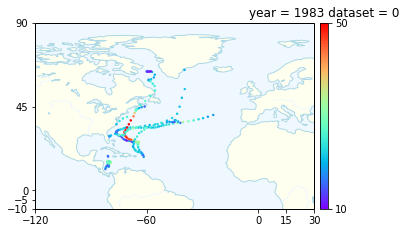

<Figure size 432x288 with 0 Axes>

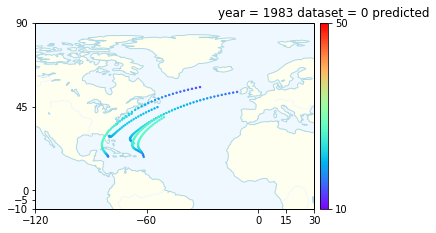

<Figure size 432x288 with 0 Axes>

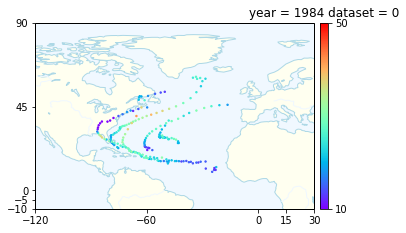

<Figure size 432x288 with 0 Axes>

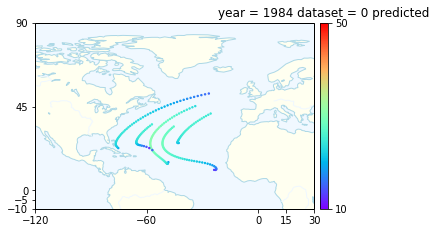

<Figure size 432x288 with 0 Axes>

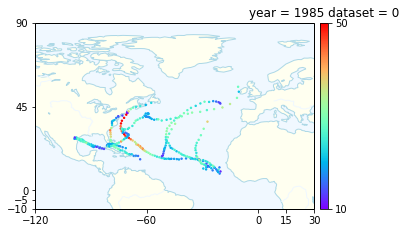

<Figure size 432x288 with 0 Axes>

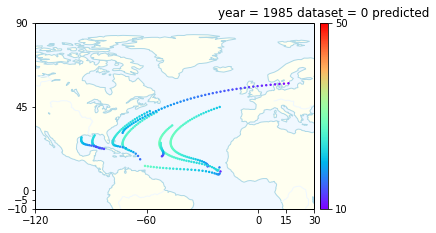

<Figure size 432x288 with 0 Axes>

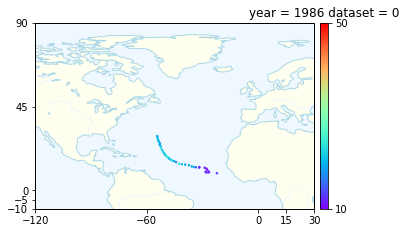

<Figure size 432x288 with 0 Axes>

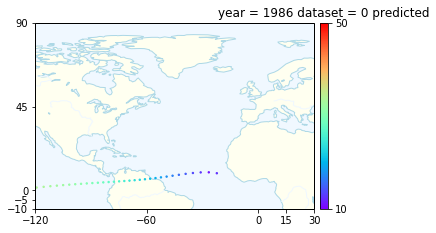

<Figure size 432x288 with 0 Axes>

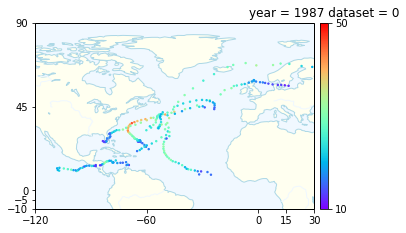

<Figure size 432x288 with 0 Axes>

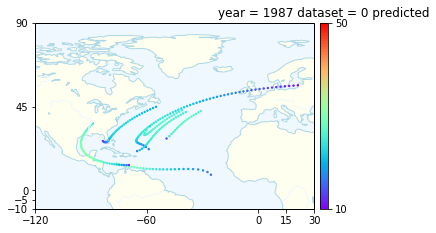

<Figure size 432x288 with 0 Axes>

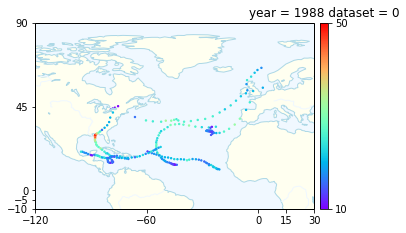

<Figure size 432x288 with 0 Axes>

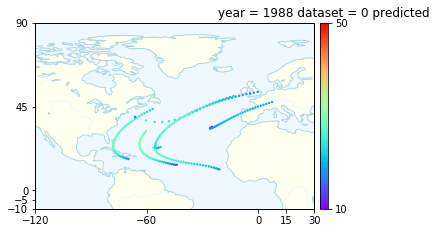

<Figure size 432x288 with 0 Axes>

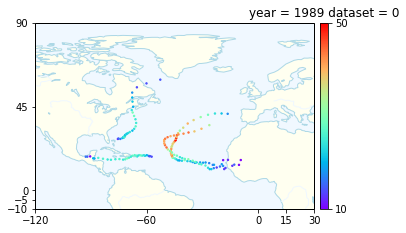

<Figure size 432x288 with 0 Axes>

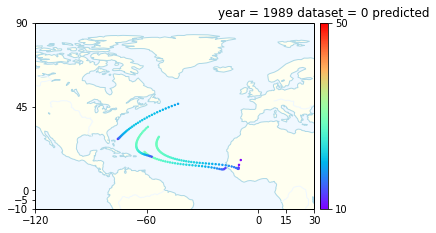

<Figure size 432x288 with 0 Axes>

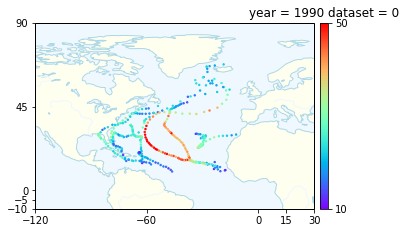

<Figure size 432x288 with 0 Axes>

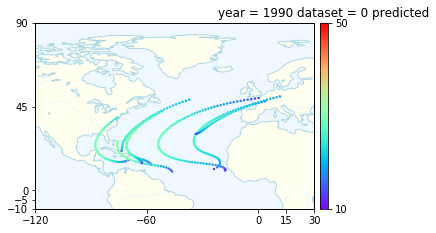

<Figure size 432x288 with 0 Axes>

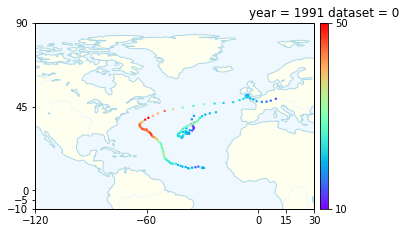

<Figure size 432x288 with 0 Axes>

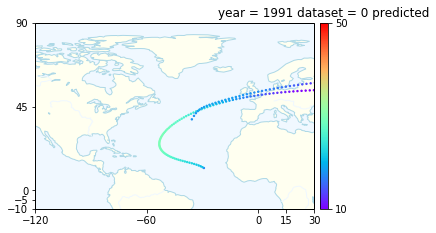

<Figure size 432x288 with 0 Axes>

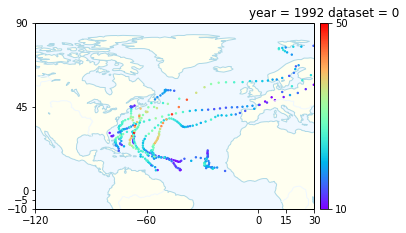

<Figure size 432x288 with 0 Axes>

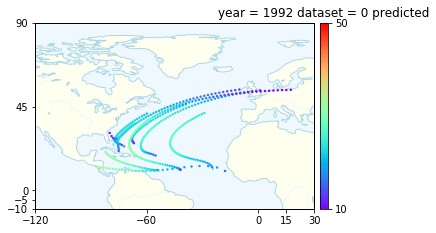

<Figure size 432x288 with 0 Axes>

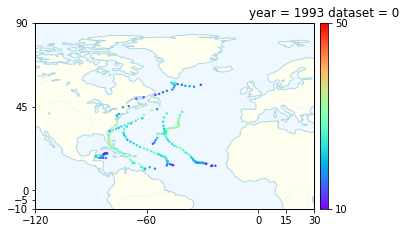

<Figure size 432x288 with 0 Axes>

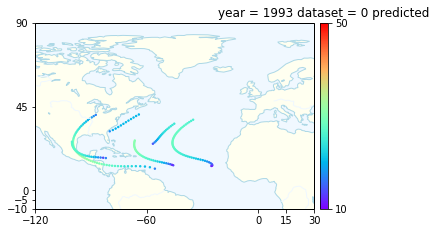

<Figure size 432x288 with 0 Axes>

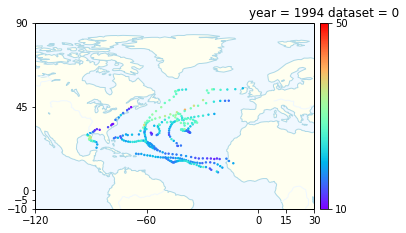

<Figure size 432x288 with 0 Axes>

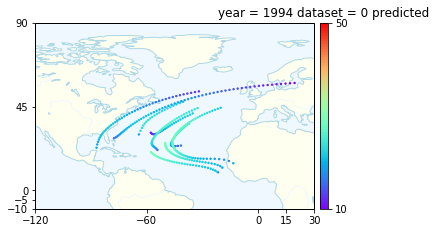

<Figure size 432x288 with 0 Axes>

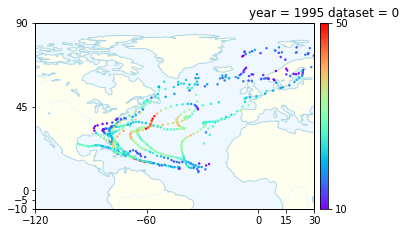

<Figure size 432x288 with 0 Axes>

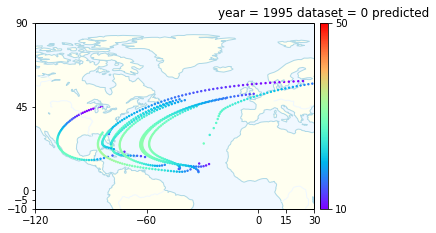

<Figure size 432x288 with 0 Axes>

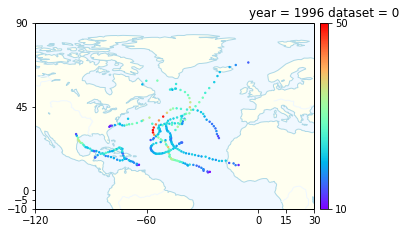

<Figure size 432x288 with 0 Axes>

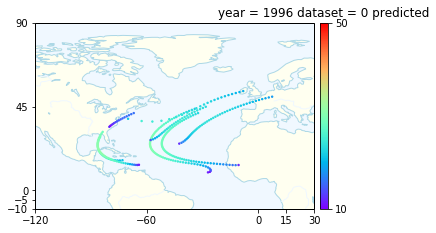

<Figure size 432x288 with 0 Axes>

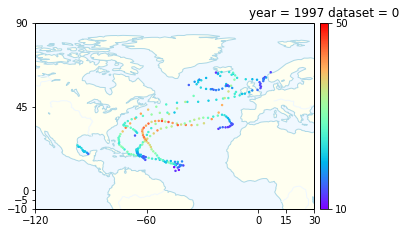

<Figure size 432x288 with 0 Axes>

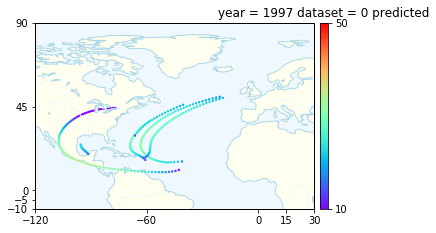

<Figure size 432x288 with 0 Axes>

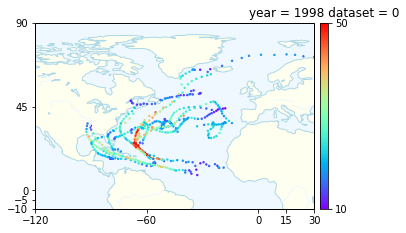

<Figure size 432x288 with 0 Axes>

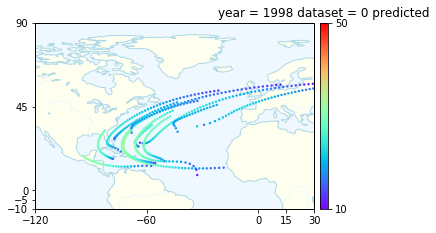

<Figure size 432x288 with 0 Axes>

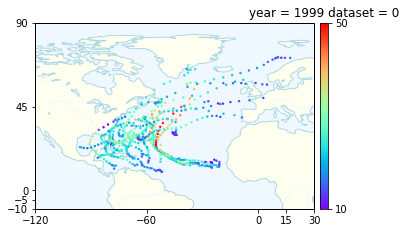

<Figure size 432x288 with 0 Axes>

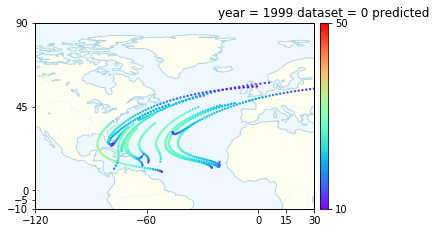

<Figure size 432x288 with 0 Axes>

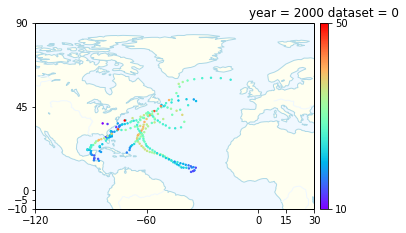

<Figure size 432x288 with 0 Axes>

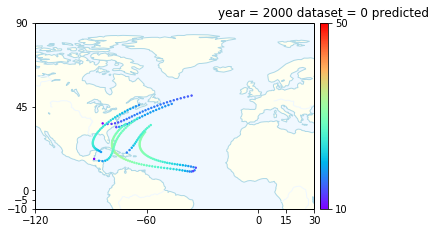

<Figure size 432x288 with 0 Axes>

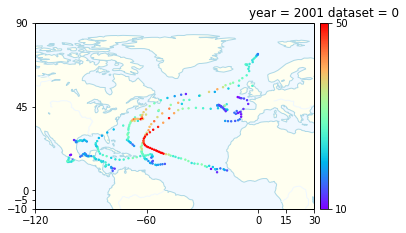

<Figure size 432x288 with 0 Axes>

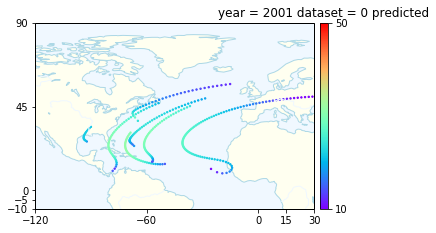

<Figure size 432x288 with 0 Axes>

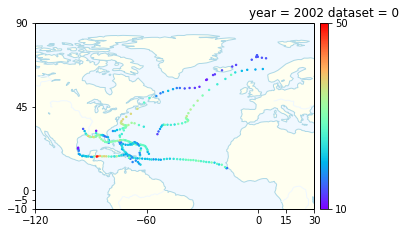

<Figure size 432x288 with 0 Axes>

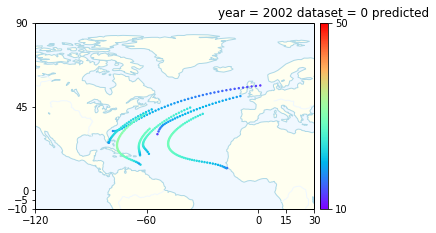

<Figure size 432x288 with 0 Axes>

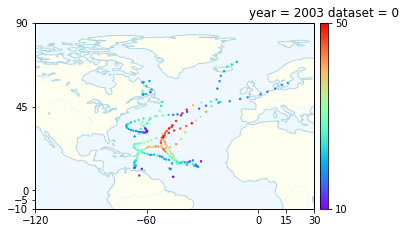

<Figure size 432x288 with 0 Axes>

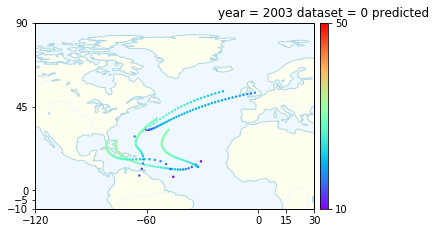

<Figure size 432x288 with 0 Axes>

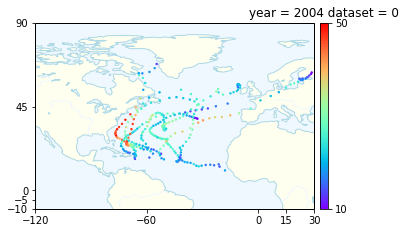

<Figure size 432x288 with 0 Axes>

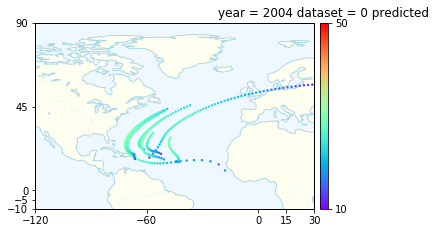

<Figure size 432x288 with 0 Axes>

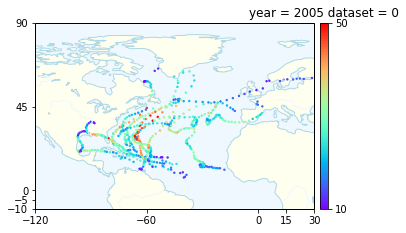

<Figure size 432x288 with 0 Axes>

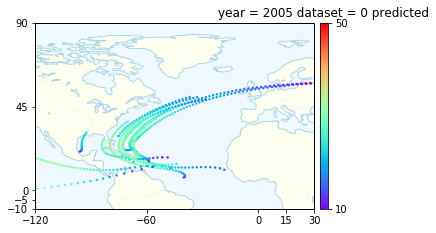

<Figure size 432x288 with 0 Axes>

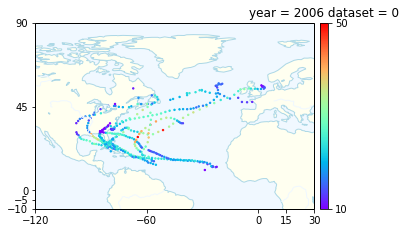

<Figure size 432x288 with 0 Axes>

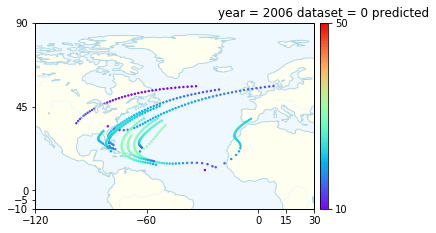

<Figure size 432x288 with 0 Axes>

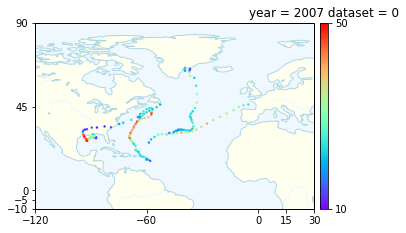

<Figure size 432x288 with 0 Axes>

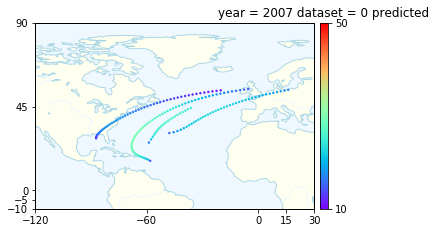

<Figure size 432x288 with 0 Axes>

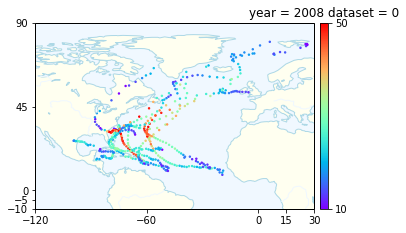

<Figure size 432x288 with 0 Axes>

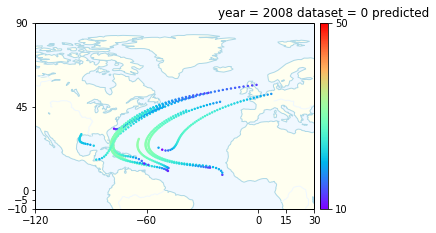

<Figure size 432x288 with 0 Axes>

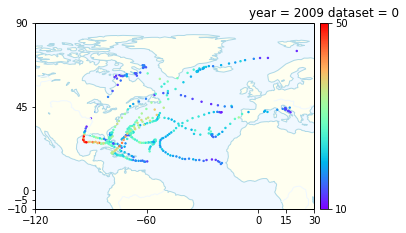

<Figure size 432x288 with 0 Axes>

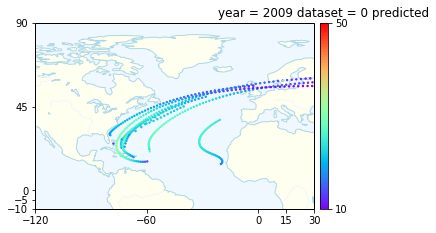

<Figure size 432x288 with 0 Axes>

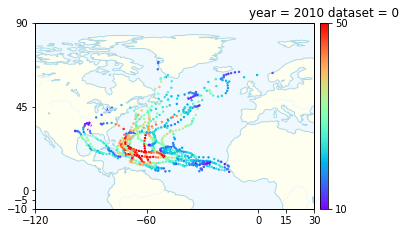

<Figure size 432x288 with 0 Axes>

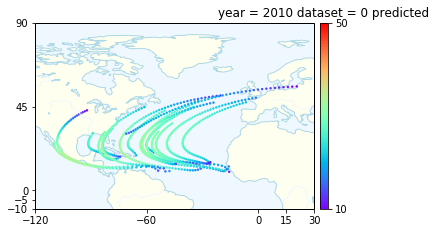

<Figure size 432x288 with 0 Axes>

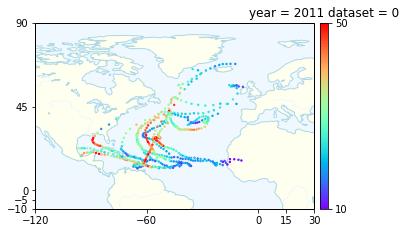

<Figure size 432x288 with 0 Axes>

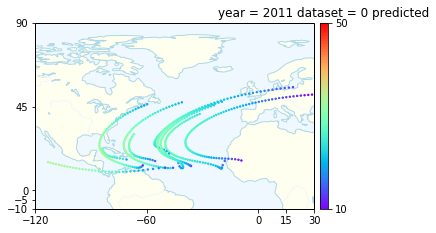

<Figure size 432x288 with 0 Axes>

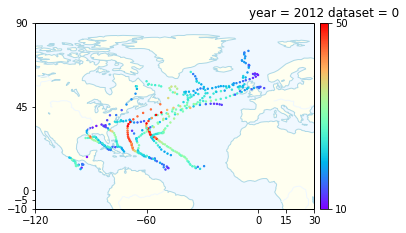

<Figure size 432x288 with 0 Axes>

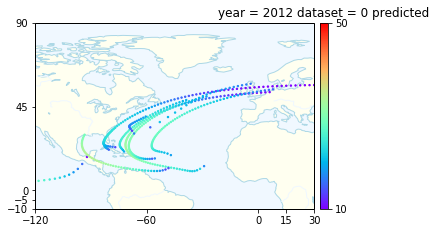

<Figure size 432x288 with 0 Axes>

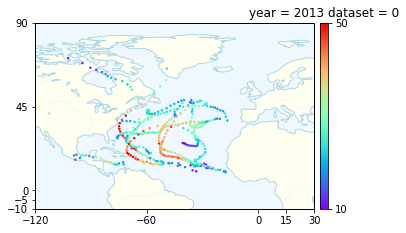

<Figure size 432x288 with 0 Axes>

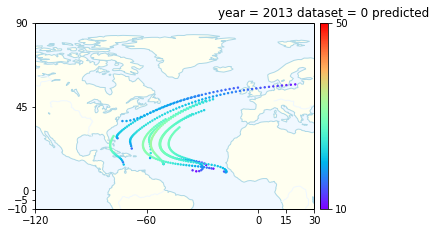

<Figure size 432x288 with 0 Axes>

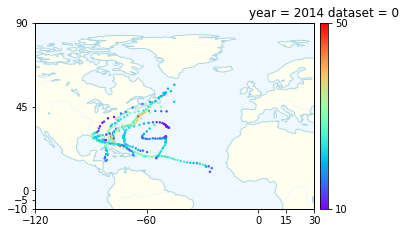

<Figure size 432x288 with 0 Axes>

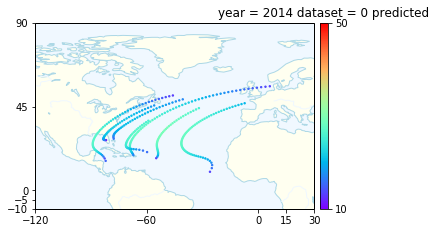

<Figure size 432x288 with 0 Axes>

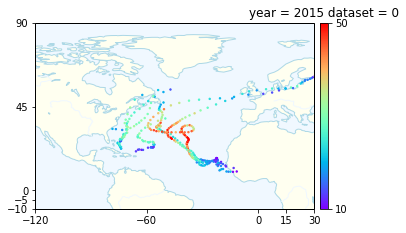

<Figure size 432x288 with 0 Axes>

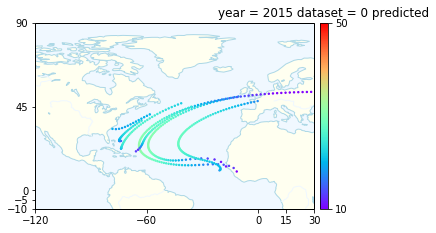

<Figure size 432x288 with 0 Axes>

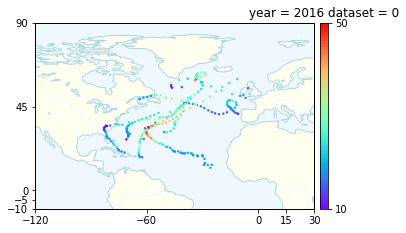

<Figure size 432x288 with 0 Axes>

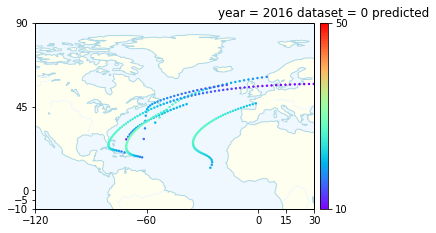

<Figure size 432x288 with 0 Axes>

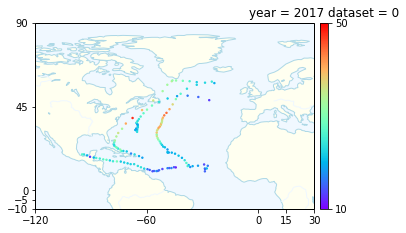

<Figure size 432x288 with 0 Axes>

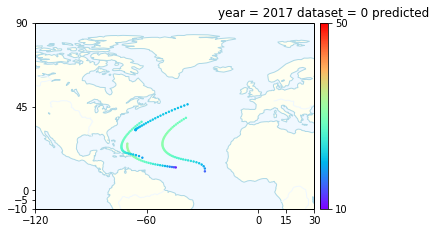

<Figure size 432x288 with 0 Axes>

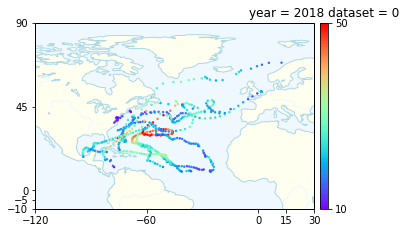

<Figure size 432x288 with 0 Axes>

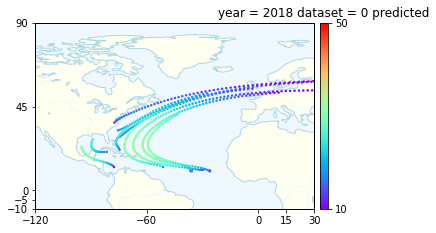

<Figure size 432x288 with 0 Axes>

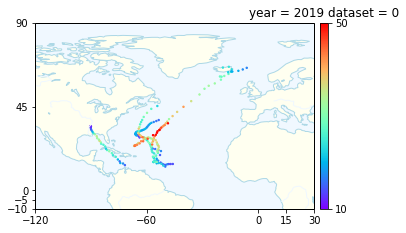

<Figure size 432x288 with 0 Axes>

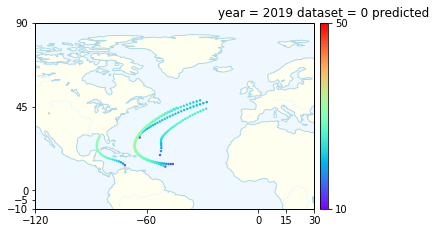

In [142]:
plot_tracks(predicted, df5)

# Assess model performance

Because the predicted storm tracks were built iteratively, a new metric is needed to assess their accuracy that will provide an indication of accuracy of prediction beyond just one timestep out in the future. To do this, for every data point in the dataset, the following 10 data points will be iteratively predicted. With these 6 to 54 hour ahead predictions (represented by the 10 predicted data points), I will quantitatively assess the average disparity between predicted and actual location for time periods from 6 hours to 54 hours in the future. 

In [116]:
def deviation(X, modelLon,modelwind,modelLat,modelSLP, includeTemp=True):

    stormID=[]

    theCount =0
    timesince =0

    #keep track of the separate storms in X
    for i in X['XCOUNT'].values:
        if i ==2: 
            theCount+=1
        stormID.append(theCount)
    Xmany = X.copy()
    Xmany['stormID']=stormID

    #keep track of the length of each storm in X
    stormlengths = Xmany.groupby('stormID').count()['const'].values
    stormLength=[]
    for i in stormID:
         stormLength.append(stormlengths[i-1])

    Xmany['length']=stormLength

    #remove temperature data
    if not includeTemp: 
        Xmany =Xmany.drop(labels='meanTemp',axis=1)


    timeframe = 10
    latpred = []
    lonpred=[]
    latreal2=[]
    lonreal2=[]

    nstorms = Xmany['stormID'].values[-1]

    for thestorm in range(1,nstorms+1,1):
        Xdrop= Xmany[Xmany['stormID']==thestorm]
        length=Xdrop['length'].values[0]
        shifts = length-timeframe+1
        X_pred = []
  
        # for different starting points of the predicted track 
        for s in range(shifts): 
            latsList =[]
            lonsList =[]
            latsList2 =[]
            lonsList2 =[]
            latsList.append(Xdrop['lat'].values[s])
            lonsList.append(Xdrop['lon'].values[s])
            firstPoint = list(Xdrop.iloc[s,:-2].values)

            latsList2.append(Xdrop['lat'].values[s])
            lonsList2.append(Xdrop['lon'].values[s])
            X_pred.append(firstPoint)
            
            # build predicted tracks 
            for m in range(9):

                latsList2.append(Xdrop['lat'].values[s+m+1])

                lonsList2.append(Xdrop['lon'].values[s+m+1])
                const = X_pred[-1][0]
                lon2 = X_pred[-1][5]
                wind2= X_pred[-1][6]
                lat2= X_pred[-1][7]
                SLP2= X_pred[-1][8]
                a = np.asarray(X_pred[-1]).reshape(1,-1)
    
    
                lon = modelLon.predict(a)[0]
                lonsList.append(lon)
                wind = modelwind.predict(a)[0]
                lat = modelLat.predict(a)[0]
                latsList.append(lat)
                SLP = modelSLP.predict(a)[0]

                XCOUNT = X_pred[-1][9]+1
                if includeTemp:
                    meanTemp = X_pred[-1][10]
                    toAppend = np.asarray([const,lon2,wind2,lat2,SLP2,lon,wind,lat,SLP,XCOUNT, meanTemp])
                else: 
                    toAppend = np.asarray([const,lon2,wind2,lat2,SLP2,lon,wind,lat,SLP,XCOUNT])
                toTransform = np.asarray([lat,lon,lat2,lon2]).reshape(1,-1)
                transformed =np.asarray(poly.fit_transform(toTransform)[0][4:])
                X_pred.append(list(toAppend)+list(transformed))
            latpred.append(latsList)
            lonpred.append(lonsList)

            latreal2.append(latsList2)
            lonreal2.append(lonsList2)

    #convert to pandas
    latpred3=pd.DataFrame(np.asarray(latpred))
    lonpred3=pd.DataFrame(np.asarray(lonpred))
    latreal3=pd.DataFrame(np.asarray(latreal2))
    lonreal3=pd.DataFrame(np.asarray(lonreal2))




    latdiff=latpred3.subtract(latreal3).abs()
    londiff=lonpred3.subtract(lonreal3).abs()

    #replace predicted values above 90 with 90
    latpred3=np.asarray(latpred3)
    toreplace=90*np.ones(latpred3.shape)
    latpred3=np.minimum(latpred3,toreplace)
    latpred3=pd.DataFrame(latpred3)


    #calculate distances between predicted and actual coordinates
    rows=[]
    for i in range(latpred3.shape[0]):
        cols =[]
        for j in range(latpred3.shape[1]):

            coords_p = (latpred3.iloc[i,j], lonpred3.iloc[i,j])
            coords_r = (latreal3.iloc[i,j], lonreal3.iloc[i,j])

            cols.append(geopy.distance.distance(coords_p, coords_r).km)
        rows.append(cols)


    rows=pd.DataFrame(np.asarray(rows))

    return rows

In [111]:
#case of temperature data included
rows1= deviation(X, modelLon,modelwind,modelLat,modelSLP,includeTemp=True)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060


888
889
890
891
892
893
894
895
896
897
898
899
900
901
902
903
904
905
906
907
908
909
910
911
912
913
914
915
916
917
918
919
920
921
922
923
924
925
926
927
928
929
930
931
932
933
934
935
936
937
938
939
940
941
942
943
944
945
946
947
948
949
950
951
952
953
954
955
956
957
958
959
960
961
962
963
964
965
966
967
968
969
970
971
972
973
974
975
976
977
978
979
980
981
982
983
984
985
986
987
988
989
990
991
992
993
994
995
996
997
998
999
1000
1001
1002
1003
1004
1005
1006
1007
1008
1009
1010
1011
1012
1013
1014
1015
1016
1017
1018
1019
1020
1021
1022
1023
1024
1025
1026
1027
1028
1029
1030
1031
1032
1033
1034
1035
1036
1037
1038
1039
1040
1041
1042
1043
1044
1045
1046
1047
1048
1049
1050
1051
1052
1053
1054
1055
1056
1057
1058
1059
1060
1061
1062
1063
1064
1065
1066
1067
1068
1069
1070
1071
1072
1073
1074
1075
1076
1077
1078
1079
1080
1081
1082
1083
1084
1085
1086
1087
1088
1089
1090
1091
1092
1093
1094
1095
1096
1097
1098
1099
1100
1101
1102
1103
1104
1105
1106
1107
1108
1109
11

3272
3273
3274
3275
3276
3277
3278
3279
3280
3281
3282
3283
3284
3285
3286
3287
3288
3289
3290
3291
3292
3293
3294
3295
3296
3297
3298
3299
3300
3301
3302
3303
3304
3305
3306
3307
3308
3309
3310
3311
3312
3313
3314
3315
3316
3317
3318
3319
3320
3321
3322
3323
3324
3325
3326
3327
3328
3329
3330
3331
3332
3333
3334
3335
3336
3337
3338
3339
3340
3341
3342
3343
3344
3345
3346
3347
3348
3349
3350
3351
3352
3353
3354
3355
3356
3357
3358
3359
3360
3361
3362
3363
3364
3365
3366
3367
3368
3369
3370
3371
3372
3373
3374
3375
3376
3377
3378
3379
3380
3381
3382
3383
3384
3385
3386
3387
3388
3389
3390
3391
3392
3393
3394
3395
3396
3397
3398
3399
3400
3401
3402
3403
3404
3405
3406
3407
3408
3409
3410
3411
3412
3413
3414
3415
3416
3417
3418
3419
3420
3421
3422
3423
3424
3425
3426
3427
3428
3429
3430
3431
3432
3433
3434
3435
3436
3437
3438
3439
3440
3441
3442
3443
3444
3445
3446
3447
3448
3449
3450
3451
3452
3453
3454
3455
3456
3457
3458
3459
3460
3461
3462
3463
3464
3465
3466
3467
3468
3469
3470
3471


5385
5386
5387
5388
5389
5390
5391
5392
5393
5394
5395
5396
5397
5398
5399
5400
5401
5402
5403
5404
5405
5406
5407
5408
5409
5410
5411
5412
5413
5414
5415
5416
5417
5418
5419
5420
5421
5422
5423
5424
5425
5426
5427
5428
5429
5430
5431
5432
5433
5434
5435
5436
5437
5438
5439
5440
5441
5442
5443
5444
5445
5446
5447
5448
5449
5450
5451
5452
5453
5454
5455
5456
5457
5458
5459
5460
5461
5462
5463
5464
5465
5466
5467
5468
5469
5470
5471
5472
5473
5474
5475
5476
5477
5478
5479
5480
5481
5482
5483
5484
5485
5486
5487
5488
5489
5490
5491
5492
5493
5494
5495
5496
5497
5498
5499
5500
5501
5502
5503
5504
5505
5506
5507
5508
5509
5510
5511
5512
5513
5514
5515
5516
5517
5518
5519
5520
5521
5522
5523
5524
5525
5526
5527
5528
5529
5530
5531
5532
5533
5534
5535
5536
5537
5538
5539
5540
5541
5542
5543
5544
5545
5546
5547
5548
5549
5550
5551
5552
5553
5554
5555
5556
5557
5558
5559
5560
5561
5562
5563
5564
5565
5566
5567
5568
5569
5570
5571
5572
5573
5574
5575
5576
5577
5578
5579
5580
5581
5582
5583
5584


7884
7885
7886
7887
7888
7889
7890
7891
7892
7893
7894
7895
7896
7897
7898
7899
7900
7901
7902
7903
7904
7905
7906
7907
7908
7909
7910
7911
7912
7913
7914
7915
7916
7917
7918
7919
7920
7921
7922
7923
7924
7925
7926
7927
7928
7929
7930
7931
7932
7933
7934
7935
7936
7937
7938
7939
7940
7941
7942
7943
7944
7945
7946
7947
7948
7949
7950
7951
7952
7953
7954
7955
7956
7957
7958
7959
7960
7961
7962
7963
7964
7965
7966
7967
7968
7969
7970
7971
7972
7973
7974
7975
7976
7977
7978
7979
7980
7981
7982
7983
7984
7985
7986
7987
7988
7989
7990
7991
7992
7993
7994
7995
7996
7997
7998
7999
8000
8001
8002
8003
8004
8005
8006
8007
8008
8009
8010
8011
8012
8013
8014
8015
8016
8017
8018
8019
8020
8021
8022
8023
8024
8025
8026
8027
8028
8029
8030
8031
8032
8033
8034
8035
8036
8037
8038
8039
8040
8041
8042
8043
8044
8045
8046
8047
8048
8049
8050
8051
8052
8053
8054
8055
8056
8057
8058
8059
8060
8061
8062
8063
8064
8065
8066
8067
8068
8069
8070
8071
8072
8073
8074
8075
8076
8077
8078
8079
8080
8081
8082
8083


10307
10308
10309
10310
10311
10312
10313
10314
10315
10316
10317
10318
10319
10320
10321
10322
10323
10324
10325
10326
10327
10328
10329
10330
10331
10332
10333
10334
10335
10336
10337
10338
10339
10340
10341
10342
10343
10344
10345
10346
10347
10348
10349
10350
10351
10352
10353
10354
10355
10356
10357
10358
10359
10360
10361
10362
10363
10364
10365
10366
10367
10368
10369
10370
10371
10372
10373
10374
10375
10376
10377
10378
10379
10380
10381
10382
10383
10384
10385
10386
10387
10388
10389
10390
10391
10392
10393
10394
10395
10396
10397
10398
10399
10400
10401
10402
10403
10404
10405
10406
10407
10408
10409
10410
10411
10412
10413
10414
10415
10416
10417
10418
10419
10420
10421
10422
10423
10424
10425
10426
10427
10428
10429
10430
10431
10432
10433
10434
10435
10436
10437
10438
10439
10440
10441
10442
10443
10444
10445
10446
10447
10448
10449
10450
10451
10452
10453
10454
10455
10456
10457
10458
10459
10460
10461
10462
10463
10464
10465
10466
10467
10468
10469
10470
10471
10472
1047

12382
12383
12384
12385
12386
12387
12388
12389
12390
12391
12392
12393
12394
12395
12396
12397
12398
12399
12400
12401
12402
12403
12404
12405
12406
12407
12408
12409
12410
12411
12412
12413
12414
12415
12416
12417
12418
12419
12420
12421
12422
12423
12424
12425
12426
12427
12428
12429
12430
12431
12432
12433
12434
12435
12436
12437
12438
12439
12440
12441
12442
12443
12444
12445
12446
12447
12448
12449
12450
12451
12452
12453
12454
12455
12456
12457
12458
12459
12460
12461
12462
12463
12464
12465
12466
12467
12468
12469
12470
12471
12472
12473
12474
12475
12476
12477
12478
12479
12480
12481
12482
12483
12484
12485
12486
12487
12488
12489
12490
12491
12492
12493
12494
12495
12496
12497
12498
12499
12500
12501
12502
12503
12504
12505
12506
12507
12508
12509
12510
12511
12512
12513
12514
12515
12516
12517
12518
12519
12520
12521
12522
12523
12524
12525
12526
12527
12528
12529
12530
12531
12532
12533
12534
12535
12536
12537
12538
12539
12540
12541
12542
12543
12544
12545
12546
12547
1254

13816
13817
13818
13819
13820
13821
13822
13823
13824
13825
13826
13827
13828
13829
13830
13831
13832
13833
13834
13835
13836
13837
13838
13839
13840
13841
13842
13843
13844
13845
13846
13847
13848
13849
13850
13851
13852
13853
13854
13855
13856
13857
13858
13859
13860
13861
13862
13863
13864
13865
13866
13867
13868
13869
13870
13871
13872
13873
13874
13875
13876
13877
13878
13879
13880
13881
13882
13883
13884
13885
13886
13887
13888
13889
13890
13891
13892
13893
13894
13895
13896
13897
13898
13899
13900
13901
13902
13903
13904
13905
13906
13907
13908
13909
13910
13911
13912
13913
13914
13915
13916
13917
13918
13919
13920
13921
13922
13923
13924
13925
13926
13927
13928
13929
13930
13931
13932
13933
13934
13935
13936
13937
13938
13939
13940
13941
13942
13943
13944
13945
13946
13947
13948
13949
13950
13951
13952
13953
13954
13955
13956
13957
13958
13959
13960
13961
13962
13963
13964
13965
13966
13967
13968
13969
13970
13971
13972
13973
13974
13975
13976
13977
13978
13979
13980
13981
1398

15880
15881
15882
15883
15884
15885
15886
15887
15888
15889
15890
15891
15892
15893
15894
15895
15896
15897
15898
15899
15900
15901
15902
15903
15904
15905
15906
15907
15908
15909
15910
15911
15912
15913
15914
15915
15916
15917
15918
15919
15920
15921
15922
15923
15924
15925
15926
15927
15928
15929
15930
15931
15932
15933
15934
15935
15936
15937
15938
15939
15940
15941
15942
15943
15944
15945
15946
15947
15948
15949
15950
15951
15952
15953
15954
15955
15956
15957
15958
15959
15960
15961
15962
15963
15964
15965
15966
15967
15968
15969
15970
15971
15972
15973
15974
15975
15976
15977
15978
15979
15980
15981
15982
15983
15984
15985
15986
15987
15988
15989
15990
15991
15992
15993
15994
15995
15996
15997
15998
15999
16000
16001
16002
16003
16004
16005
16006
16007
16008
16009
16010
16011
16012
16013
16014
16015
16016
16017
16018
16019
16020
16021
16022
16023
16024
16025
16026
16027
16028
16029
16030
16031
16032
16033
16034
16035
16036
16037
16038
16039
16040
16041
16042
16043
16044
16045
1604

17879
17880
17881
17882
17883
17884
17885
17886
17887
17888
17889
17890
17891
17892
17893
17894
17895
17896
17897
17898
17899
17900
17901
17902
17903
17904
17905
17906
17907
17908
17909
17910
17911
17912
17913
17914
17915
17916
17917
17918
17919
17920
17921
17922
17923
17924
17925
17926
17927
17928
17929
17930
17931
17932
17933
17934
17935
17936
17937
17938
17939
17940
17941
17942
17943
17944
17945
17946
17947
17948
17949
17950
17951
17952
17953
17954
17955
17956
17957
17958
17959
17960
17961
17962
17963
17964
17965
17966
17967
17968
17969
17970
17971
17972
17973
17974
17975
17976
17977
17978
17979
17980
17981
17982
17983
17984
17985
17986
17987
17988
17989
17990
17991
17992
17993
17994
17995
17996
17997
17998
17999
18000
18001
18002
18003
18004
18005
18006
18007
18008
18009
18010
18011
18012
18013
18014
18015
18016
18017
18018
18019
18020
18021
18022
18023
18024
18025
18026
18027
18028
18029
18030
18031
18032
18033
18034
18035
18036
18037
18038
18039
18040
18041
18042
18043
18044
1804

19881
19882
19883
19884
19885
19886
19887
19888
19889
19890
19891
19892
19893
19894
19895
19896
19897
19898
19899
19900
19901
19902
19903
19904
19905
19906
19907
19908
19909
19910
19911
19912
19913
19914
19915
19916
19917
19918
19919
19920
19921
19922
19923
19924
19925
19926
19927
19928
19929
19930
19931
19932
19933
19934
19935
19936
19937
19938
19939
19940
19941
19942
19943
19944
19945
19946
19947
19948
19949
19950
19951
19952
19953
19954
19955
19956
19957
19958
19959
19960
19961
19962
19963
19964
19965
19966
19967
19968
19969
19970
19971
19972
19973
19974
19975
19976
19977
19978
19979
19980
19981
19982
19983
19984
19985
19986
19987
19988
19989
19990
19991
19992
19993
19994
19995
19996
19997
19998
19999
20000
20001
20002
20003
20004
20005
20006
20007
20008
20009
20010
20011
20012
20013
20014
20015
20016
20017
20018
20019
20020
20021
20022
20023
20024
20025
20026
20027
20028
20029
20030
20031
20032
20033
20034
20035
20036
20037
20038
20039
20040
20041
20042
20043
20044
20045
20046
2004

21877
21878
21879
21880
21881
21882
21883
21884
21885
21886
21887
21888
21889
21890
21891
21892
21893
21894
21895
21896
21897
21898
21899
21900
21901
21902
21903
21904
21905
21906
21907
21908
21909
21910
21911
21912
21913
21914
21915
21916
21917
21918
21919
21920
21921
21922
21923
21924
21925
21926
21927
21928
21929
21930
21931
21932
21933
21934
21935
21936
21937
21938
21939
21940
21941
21942
21943
21944
21945
21946
21947
21948
21949
21950
21951
21952
21953
21954
21955
21956
21957
21958
21959
21960
21961
21962
21963
21964
21965
21966
21967
21968
21969
21970
21971
21972
21973
21974
21975
21976
21977
21978
21979
21980
21981
21982
21983
21984
21985
21986
21987
21988
21989
21990
21991
21992
21993
21994
21995
21996
21997
21998
21999
22000
22001
22002
22003
22004
22005
22006
22007
22008
22009
22010
22011
22012
22013
22014
22015
22016
22017
22018
22019
22020
22021
22022
22023
22024
22025
22026
22027
22028
22029
22030
22031
22032
22033
22034
22035
22036
22037
22038
22039
22040
22041
22042
2204

23377
23378
23379
23380
23381
23382
23383
23384
23385
23386
23387
23388
23389
23390
23391
23392
23393
23394
23395
23396
23397
23398
23399
23400
23401
23402
23403
23404
23405
23406
23407
23408
23409
23410
23411
23412
23413
23414
23415
23416
23417
23418
23419
23420
23421
23422
23423
23424
23425
23426
23427
23428
23429
23430
23431
23432
23433
23434
23435
23436
23437
23438
23439
23440
23441
23442
23443
23444
23445
23446
23447
23448
23449
23450
23451
23452
23453
23454
23455
23456
23457
23458
23459
23460
23461
23462
23463
23464
23465
23466
23467
23468
23469
23470
23471
23472
23473
23474
23475
23476
23477
23478
23479
23480
23481
23482
23483
23484
23485
23486
23487
23488
23489
23490
23491
23492
23493
23494
23495
23496
23497
23498
23499
23500
23501
23502
23503
23504
23505
23506
23507
23508
23509
23510
23511
23512
23513
23514
23515
23516
23517
23518
23519
23520
23521
23522
23523
23524
23525
23526
23527
23528
23529
23530
23531
23532
23533
23534
23535
23536
23537
23538
23539
23540
23541
23542
2354

25376
25377
25378
25379
25380
25381
25382
25383
25384
25385
25386
25387
25388
25389
25390
25391
25392
25393
25394
25395
25396
25397
25398
25399
25400
25401
25402
25403
25404
25405
25406
25407
25408
25409
25410
25411
25412
25413
25414
25415
25416
25417
25418
25419
25420
25421
25422
25423
25424
25425
25426
25427
25428
25429
25430
25431
25432
25433
25434
25435
25436
25437
25438
25439
25440
25441
25442
25443
25444
25445
25446
25447
25448
25449
25450
25451
25452
25453
25454
25455
25456
25457
25458
25459
25460
25461
25462
25463
25464
25465
25466
25467
25468
25469
25470
25471
25472
25473
25474
25475
25476
25477
25478
25479
25480
25481
25482
25483
25484
25485
25486
25487
25488
25489
25490
25491
25492
25493
25494
25495
25496
25497
25498
25499
25500
25501
25502
25503
25504
25505
25506
25507
25508
25509
25510
25511
25512
25513
25514
25515
25516
25517
25518
25519
25520
25521
25522
25523
25524
25525
25526
25527
25528
25529
25530
25531
25532
25533
25534
25535
25536
25537
25538
25539
25540
25541
2554

27580
27581
27582
27583
27584
27585
27586
27587
27588
27589
27590
27591
27592
27593
27594
27595
27596
27597
27598
27599
27600
27601
27602
27603
27604
27605
27606
27607
27608
27609
27610
27611
27612
27613
27614
27615
27616
27617
27618
27619
27620
27621
27622
27623
27624
27625
27626
27627
27628
27629
27630
27631
27632
27633
27634
27635
27636
27637
27638
27639
27640
27641
27642
27643
27644
27645
27646
27647
27648
27649
27650
27651
27652
27653
27654
27655
27656
27657
27658
27659
27660
27661
27662
27663
27664
27665
27666
27667
27668
27669
27670
27671
27672
27673
27674
27675
27676
27677
27678
27679
27680
27681
27682
27683
27684
27685
27686
27687
27688
27689
27690
27691
27692
27693
27694
27695
27696
27697
27698
27699
27700
27701
27702
27703
27704
27705
27706
27707
27708
27709
27710
27711
27712
27713
27714
27715
27716
27717
27718
27719
27720
27721
27722
27723
27724
27725
27726
27727
27728
27729
27730
27731
27732
27733
27734
27735
27736
27737
27738
27739
27740
27741
27742
27743
27744
27745
2774

30373
30374
30375
30376
30377
30378
30379
30380
30381
30382
30383
30384
30385
30386
30387
30388
30389
30390
30391
30392
30393
30394
30395
30396
30397
30398
30399
30400
30401
30402
30403
30404
30405
30406
30407
30408
30409
30410
30411
30412
30413
30414
30415
30416
30417
30418
30419
30420
30421
30422
30423
30424
30425
30426
30427
30428
30429
30430
30431
30432
30433
30434
30435
30436
30437
30438
30439
30440
30441
30442
30443
30444
30445
30446
30447
30448
30449
30450
30451
30452
30453
30454
30455
30456
30457
30458
30459
30460
30461
30462
30463
30464
30465
30466
30467
30468
30469
30470
30471
30472
30473
30474
30475
30476
30477
30478
30479
30480
30481
30482
30483
30484
30485
30486
30487
30488
30489
30490
30491
30492
30493
30494
30495
30496
30497
30498
30499
30500
30501
30502
30503
30504
30505
30506
30507
30508
30509
30510
30511
30512
30513
30514
30515
30516
30517
30518
30519
30520
30521
30522
30523
30524
30525
30526
30527
30528
30529
30530
30531
30532
30533
30534
30535
30536
30537
30538
3053

32372
32373
32374
32375
32376
32377
32378
32379
32380
32381
32382
32383
32384
32385
32386
32387
32388
32389
32390
32391
32392
32393
32394
32395
32396
32397
32398
32399
32400
32401
32402
32403
32404
32405
32406
32407
32408
32409
32410
32411
32412
32413
32414
32415
32416
32417
32418
32419
32420
32421
32422
32423
32424
32425
32426
32427
32428
32429
32430
32431
32432
32433
32434
32435
32436
32437
32438
32439
32440
32441
32442
32443
32444
32445
32446
32447
32448
32449
32450
32451
32452
32453
32454
32455
32456
32457
32458
32459
32460
32461
32462
32463
32464
32465
32466
32467
32468
32469
32470
32471
32472
32473
32474
32475
32476
32477
32478
32479
32480
32481
32482
32483
32484
32485
32486
32487
32488
32489
32490
32491
32492
32493
32494
32495
32496
32497
32498
32499
32500
32501
32502
32503
32504
32505
32506
32507
32508
32509
32510
32511
32512
32513
32514
32515
32516
32517
32518
32519
32520
32521
32522
32523
32524
32525
32526
32527
32528
32529
32530
32531
32532
32533
32534
32535
32536
32537
3253

34371
34372
34373
34374
34375
34376
34377
34378
34379
34380
34381
34382
34383
34384
34385
34386
34387
34388
34389
34390
34391
34392
34393
34394
34395
34396
34397
34398
34399
34400
34401
34402
34403
34404
34405
34406
34407
34408
34409
34410
34411
34412
34413
34414
34415
34416
34417
34418
34419
34420
34421
34422
34423
34424
34425
34426
34427
34428
34429
34430
34431
34432
34433
34434
34435
34436
34437
34438
34439
34440
34441
34442
34443
34444
34445
34446
34447
34448
34449
34450
34451
34452
34453
34454
34455
34456
34457
34458
34459
34460
34461
34462
34463
34464
34465
34466
34467
34468
34469
34470
34471
34472
34473
34474
34475
34476
34477
34478
34479
34480
34481
34482
34483
34484
34485
34486
34487
34488
34489
34490
34491
34492
34493
34494
34495
34496
34497
34498
34499
34500
34501
34502
34503
34504
34505
34506
34507
34508
34509
34510
34511
34512
34513
34514
34515
34516
34517
34518
34519
34520
34521
34522
34523
34524
34525
34526
34527
34528
34529
34530
34531
34532
34533
34534
34535
34536
3453

35871
35872
35873
35874
35875
35876
35877
35878
35879
35880
35881
35882
35883
35884
35885
35886
35887
35888
35889
35890
35891
35892
35893
35894
35895
35896
35897
35898
35899
35900
35901
35902
35903
35904
35905
35906
35907
35908
35909
35910
35911
35912
35913
35914
35915
35916
35917
35918
35919
35920
35921
35922
35923
35924
35925
35926
35927
35928
35929
35930
35931
35932
35933
35934
35935
35936
35937
35938
35939
35940
35941
35942
35943
35944
35945
35946
35947
35948
35949
35950
35951
35952
35953
35954
35955
35956
35957
35958
35959
35960
35961
35962
35963
35964
35965
35966
35967
35968
35969
35970
35971
35972
35973
35974
35975
35976
35977
35978
35979
35980
35981
35982
35983
35984
35985
35986
35987
35988
35989
35990
35991
35992
35993
35994
35995
35996
35997
35998
35999
36000
36001
36002
36003
36004
36005
36006
36007
36008
36009
36010
36011
36012
36013
36014
36015
36016
36017
36018
36019
36020
36021
36022
36023
36024
36025
36026
36027
36028
36029
36030
36031
36032
36033
36034
36035
36036
3603

37370
37371
37372
37373
37374
37375
37376
37377
37378
37379
37380
37381
37382
37383
37384
37385
37386
37387
37388
37389
37390
37391
37392
37393
37394
37395
37396
37397
37398
37399
37400
37401
37402
37403
37404
37405
37406
37407
37408
37409
37410
37411
37412
37413
37414
37415
37416
37417
37418
37419
37420
37421
37422
37423
37424
37425
37426
37427
37428
37429
37430
37431
37432
37433
37434
37435
37436
37437
37438
37439
37440
37441
37442
37443
37444
37445
37446
37447
37448
37449
37450
37451
37452
37453
37454
37455
37456
37457
37458
37459
37460
37461
37462
37463
37464
37465
37466
37467
37468
37469
37470
37471
37472
37473
37474
37475
37476
37477
37478
37479
37480
37481
37482
37483
37484
37485
37486
37487
37488
37489
37490
37491
37492
37493
37494
37495
37496
37497
37498
37499
37500
37501
37502
37503
37504
37505
37506
37507
37508
37509
37510
37511
37512
37513
37514
37515
37516
37517
37518
37519
37520
37521
37522
37523
37524
37525
37526
37527
37528
37529
37530
37531
37532
37533
37534
37535
3753

39369
39370
39371
39372
39373
39374
39375
39376
39377
39378
39379
39380
39381
39382
39383
39384
39385
39386
39387
39388
39389
39390
39391
39392
39393
39394
39395
39396
39397
39398
39399
39400
39401
39402
39403
39404
39405
39406
39407
39408
39409
39410
39411
39412
39413
39414
39415
39416
39417
39418
39419
39420
39421
39422
39423
39424
39425
39426
39427
39428
39429
39430
39431
39432
39433
39434
39435
39436
39437
39438
39439
39440
39441
39442
39443
39444
39445
39446
39447
39448
39449
39450
39451
39452
39453
39454
39455
39456
39457
39458
39459
39460
39461
39462
39463
39464
39465
39466
39467
39468
39469
39470
39471
39472
39473
39474
39475
39476
39477
39478
39479
39480
39481
39482
39483
39484
39485
39486
39487
39488
39489
39490
39491
39492
39493
39494
39495
39496
39497
39498
39499
39500
39501
39502
39503
39504
39505
39506
39507
39508
39509
39510
39511
39512
39513
39514
39515
39516
39517
39518
39519
39520
39521
39522
39523
39524
39525
39526
39527
39528
39529
39530
39531
39532
39533
39534
3953

41862
41863
41864
41865
41866
41867
41868
41869
41870
41871
41872
41873
41874
41875
41876
41877
41878
41879
41880
41881
41882
41883
41884
41885
41886
41887
41888
41889
41890
41891
41892
41893
41894
41895
41896
41897
41898
41899
41900
41901
41902
41903
41904
41905
41906
41907
41908
41909
41910
41911
41912
41913
41914
41915
41916
41917
41918
41919
41920
41921
41922
41923
41924
41925
41926
41927
41928
41929
41930
41931
41932
41933
41934
41935
41936
41937
41938
41939
41940
41941
41942
41943
41944
41945
41946
41947
41948
41949
41950
41951
41952
41953
41954
41955
41956
41957
41958
41959
41960
41961
41962
41963
41964
41965
41966
41967
41968
41969
41970
41971
41972
41973
41974
41975
41976
41977
41978
41979
41980
41981
41982
41983
41984
41985
41986
41987
41988
41989
41990
41991
41992
41993
41994
41995
41996
41997
41998
41999
42000
42001
42002
42003
42004
42005
42006
42007
42008
42009
42010
42011
42012
42013
42014
42015
42016
42017
42018
42019
42020
42021
42022
42023
42024
42025
42026
42027
4202

43867
43868
43869
43870
43871
43872
43873
43874
43875
43876
43877
43878
43879
43880
43881
43882
43883
43884
43885
43886
43887
43888
43889
43890
43891
43892
43893
43894
43895
43896
43897
43898
43899
43900
43901
43902
43903
43904
43905
43906
43907
43908
43909
43910
43911
43912
43913
43914
43915
43916
43917
43918
43919
43920
43921
43922
43923
43924
43925
43926
43927
43928
43929
43930
43931
43932
43933
43934
43935
43936
43937
43938
43939
43940
43941
43942
43943
43944
43945
43946
43947
43948
43949
43950
43951
43952
43953
43954
43955
43956
43957
43958
43959
43960
43961
43962
43963
43964
43965
43966
43967
43968
43969
43970
43971
43972
43973
43974
43975
43976
43977
43978
43979
43980
43981
43982
43983
43984
43985
43986
43987
43988
43989
43990
43991
43992
43993
43994
43995
43996
43997
43998
43999
44000
44001
44002
44003
44004
44005
44006
44007
44008
44009
44010
44011
44012
44013
44014
44015
44016
44017
44018
44019
44020
44021
44022
44023
44024
44025
44026
44027
44028
44029
44030
44031
44032
4403

45367
45368
45369
45370
45371
45372
45373
45374
45375
45376
45377
45378
45379
45380
45381
45382
45383
45384
45385
45386
45387
45388
45389
45390
45391
45392
45393
45394
45395
45396
45397
45398
45399
45400
45401
45402
45403
45404
45405
45406
45407
45408
45409
45410
45411
45412
45413
45414
45415
45416
45417
45418
45419
45420
45421
45422
45423
45424
45425
45426
45427
45428
45429
45430
45431
45432
45433
45434
45435
45436
45437
45438
45439
45440
45441
45442
45443
45444
45445
45446
45447
45448
45449
45450
45451
45452
45453
45454
45455
45456
45457
45458
45459
45460
45461
45462
45463
45464
45465
45466
45467
45468
45469
45470
45471
45472
45473
45474
45475
45476
45477
45478
45479
45480
45481
45482
45483
45484
45485
45486
45487
45488
45489
45490
45491
45492
45493
45494
45495
45496
45497
45498
45499
45500
45501
45502
45503
45504
45505
45506
45507
45508
45509
45510
45511
45512
45513
45514
45515
45516
45517
45518
45519
45520
45521
45522
45523
45524
45525
45526
45527
45528
45529
45530
45531
45532
4553

46866
46867
46868
46869
46870
46871
46872
46873
46874
46875
46876
46877
46878
46879
46880
46881
46882
46883
46884
46885
46886
46887
46888
46889
46890
46891
46892
46893
46894
46895
46896
46897
46898
46899
46900
46901
46902
46903
46904
46905
46906
46907
46908
46909
46910
46911
46912
46913
46914
46915
46916
46917
46918
46919
46920
46921
46922
46923
46924
46925
46926
46927
46928
46929
46930
46931
46932
46933
46934
46935
46936
46937
46938
46939
46940
46941
46942
46943
46944
46945
46946
46947
46948
46949
46950
46951
46952
46953
46954
46955
46956
46957
46958
46959
46960
46961
46962
46963
46964
46965
46966
46967
46968
46969
46970
46971
46972
46973
46974
46975
46976
46977
46978
46979
46980
46981
46982
46983
46984
46985
46986
46987
46988
46989
46990
46991
46992
46993
46994
46995
46996
46997
46998
46999
47000
47001
47002
47003
47004
47005
47006
47007
47008
47009
47010
47011
47012
47013
47014
47015
47016
47017
47018
47019
47020
47021
47022
47023
47024
47025
47026
47027
47028
47029
47030
47031
4703

48903
48904
48905
48906
48907
48908
48909
48910
48911
48912
48913
48914
48915
48916
48917
48918
48919
48920
48921
48922
48923
48924
48925
48926
48927
48928
48929
48930
48931
48932
48933
48934
48935
48936
48937
48938
48939
48940
48941
48942
48943
48944
48945
48946
48947
48948
48949
48950
48951
48952
48953
48954
48955
48956
48957
48958
48959
48960
48961
48962
48963
48964
48965
48966
48967
48968
48969
48970
48971
48972
48973
48974
48975
48976
48977
48978
48979
48980
48981
48982
48983
48984
48985
48986
48987
48988
48989
48990
48991
48992
48993
48994
48995
48996
48997
48998
48999
49000
49001
49002
49003
49004
49005
49006
49007
49008
49009
49010
49011
49012
49013
49014
49015
49016
49017
49018
49019
49020
49021
49022
49023
49024
49025
49026
49027
49028
49029
49030
49031
49032
49033
49034
49035
49036
49037
49038
49039
49040
49041
49042
49043
49044
49045
49046
49047
49048
49049
49050
49051
49052
49053
49054
49055
49056
49057
49058
49059
49060
49061
49062
49063
49064
49065
49066
49067
49068
4906

50864
50865
50866
50867
50868
50869
50870
50871
50872
50873
50874
50875
50876
50877
50878
50879
50880
50881
50882
50883
50884
50885
50886
50887
50888
50889
50890
50891
50892
50893
50894
50895
50896
50897
50898
50899
50900
50901
50902
50903
50904
50905
50906
50907
50908
50909
50910
50911
50912
50913
50914
50915
50916
50917
50918
50919
50920
50921
50922
50923
50924
50925
50926
50927
50928
50929
50930
50931
50932
50933
50934
50935
50936
50937
50938
50939
50940
50941
50942
50943
50944
50945
50946
50947
50948
50949
50950
50951
50952
50953
50954
50955
50956
50957
50958
50959
50960
50961
50962
50963
50964
50965
50966
50967
50968
50969
50970
50971
50972
50973
50974
50975
50976
50977
50978
50979
50980
50981
50982
50983
50984
50985
50986
50987
50988
50989
50990
50991
50992
50993
50994
50995
50996
50997
50998
50999
51000
51001
51002
51003
51004
51005
51006
51007
51008
51009
51010
51011
51012
51013
51014
51015
51016
51017
51018
51019
51020
51021
51022
51023
51024
51025
51026
51027
51028
51029
5103

53363
53364
53365
53366
53367
53368
53369
53370
53371
53372
53373
53374
53375
53376
53377
53378
53379
53380
53381
53382
53383
53384
53385
53386
53387
53388
53389
53390
53391
53392
53393
53394
53395
53396
53397
53398
53399
53400
53401
53402
53403
53404
53405
53406
53407
53408
53409
53410
53411
53412
53413
53414
53415
53416
53417
53418
53419
53420
53421
53422
53423
53424
53425
53426
53427
53428
53429
53430
53431
53432
53433
53434
53435
53436
53437
53438
53439
53440
53441
53442
53443
53444
53445
53446
53447
53448
53449
53450
53451
53452
53453
53454
53455
53456
53457
53458
53459
53460
53461
53462
53463
53464
53465
53466
53467
53468
53469
53470
53471
53472
53473
53474
53475
53476
53477
53478
53479
53480
53481
53482
53483
53484
53485
53486
53487
53488
53489
53490
53491
53492
53493
53494
53495
53496
53497
53498
53499
53500
53501
53502
53503
53504
53505
53506
53507
53508
53509
53510
53511
53512
53513
53514
53515
53516
53517
53518
53519
53520
53521
53522
53523
53524
53525
53526
53527
53528
5352

55362
55363
55364
55365
55366
55367
55368
55369
55370
55371
55372
55373
55374
55375
55376
55377
55378
55379
55380
55381
55382
55383
55384
55385
55386
55387
55388
55389
55390
55391
55392
55393
55394
55395
55396
55397
55398
55399
55400
55401
55402
55403
55404
55405
55406
55407
55408
55409
55410
55411
55412
55413
55414
55415
55416
55417
55418
55419
55420
55421
55422
55423
55424
55425
55426
55427
55428
55429
55430
55431
55432
55433
55434
55435
55436
55437
55438
55439
55440
55441
55442
55443
55444
55445
55446
55447
55448
55449
55450
55451
55452
55453
55454
55455
55456
55457
55458
55459
55460
55461
55462
55463
55464
55465
55466
55467
55468
55469
55470
55471
55472
55473
55474
55475
55476
55477
55478
55479
55480
55481
55482
55483
55484
55485
55486
55487
55488
55489
55490
55491
55492
55493
55494
55495
55496
55497
55498
55499
55500
55501
55502
55503
55504
55505
55506
55507
55508
55509
55510
55511
55512
55513
55514
55515
55516
55517
55518
55519
55520
55521
55522
55523
55524
55525
55526
55527
5552

57861
57862
57863
57864
57865
57866
57867
57868
57869
57870
57871
57872
57873
57874
57875
57876
57877
57878
57879
57880
57881
57882
57883
57884
57885
57886
57887
57888
57889
57890
57891
57892
57893
57894
57895
57896
57897
57898
57899
57900
57901
57902
57903
57904
57905
57906
57907
57908
57909
57910
57911
57912
57913
57914
57915
57916
57917
57918
57919
57920
57921
57922
57923
57924
57925
57926
57927
57928
57929
57930
57931
57932
57933
57934
57935
57936
57937
57938
57939
57940
57941
57942
57943
57944
57945
57946
57947
57948
57949
57950
57951
57952
57953
57954
57955
57956
57957
57958
57959
57960
57961
57962
57963
57964
57965
57966
57967
57968
57969
57970
57971
57972
57973
57974
57975
57976
57977
57978
57979
57980
57981
57982
57983
57984
57985
57986
57987
57988
57989
57990
57991
57992
57993
57994
57995
57996
57997
57998
57999
58000
58001
58002
58003
58004
58005
58006
58007
58008
58009
58010
58011
58012
58013
58014
58015
58016
58017
58018
58019
58020
58021
58022
58023
58024
58025
58026
5802

59860
59861
59862
59863
59864
59865
59866
59867
59868
59869
59870
59871
59872
59873
59874
59875
59876
59877
59878
59879
59880
59881
59882
59883
59884
59885
59886
59887
59888
59889
59890
59891
59892
59893
59894
59895
59896
59897
59898
59899
59900
59901
59902
59903
59904
59905
59906
59907
59908
59909
59910
59911
59912
59913
59914
59915
59916
59917
59918
59919
59920
59921
59922
59923
59924
59925
59926
59927
59928
59929
59930
59931
59932
59933
59934
59935
59936
59937
59938
59939
59940
59941
59942
59943
59944
59945
59946
59947
59948
59949
59950
59951
59952
59953
59954
59955
59956
59957
59958
59959
59960
59961
59962
59963
59964
59965
59966
59967
59968
59969
59970
59971
59972
59973
59974
59975
59976
59977
59978
59979
59980
59981
59982
59983
59984
59985
59986
59987
59988
59989
59990
59991
59992
59993
59994
59995
59996
59997
59998
59999
60000
60001
60002
60003
60004
60005
60006
60007
60008
60009
60010
60011
60012
60013
60014
60015
60016
60017
60018
60019
60020
60021
60022
60023
60024
60025
6002

61859
61860
61861
61862
61863
61864
61865
61866
61867
61868
61869
61870
61871
61872
61873
61874
61875
61876
61877
61878
61879
61880
61881
61882
61883
61884
61885
61886
61887
61888
61889
61890
61891
61892
61893
61894
61895
61896
61897
61898
61899
61900
61901
61902
61903
61904
61905
61906
61907
61908
61909
61910
61911
61912
61913
61914
61915
61916
61917
61918
61919
61920
61921
61922
61923
61924
61925
61926
61927
61928
61929
61930
61931
61932
61933
61934
61935
61936
61937
61938
61939
61940
61941
61942
61943
61944
61945
61946
61947
61948
61949
61950
61951
61952
61953
61954
61955
61956
61957
61958
61959
61960
61961
61962
61963
61964
61965
61966
61967
61968
61969
61970
61971
61972
61973
61974
61975
61976
61977
61978
61979
61980
61981
61982
61983
61984
61985
61986
61987
61988
61989
61990
61991
61992
61993
61994
61995
61996
61997
61998
61999
62000
62001
62002
62003
62004
62005
62006
62007
62008
62009
62010
62011
62012
62013
62014
62015
62016
62017
62018
62019
62020
62021
62022
62023
62024
6202

63858
63859
63860
63861
63862
63863
63864
63865
63866
63867
63868
63869
63870
63871
63872
63873
63874
63875
63876
63877
63878
63879
63880
63881
63882
63883
63884
63885
63886
63887
63888
63889
63890
63891
63892
63893
63894
63895
63896
63897
63898
63899
63900
63901
63902
63903
63904
63905
63906
63907
63908
63909
63910
63911
63912
63913
63914
63915
63916
63917
63918
63919
63920
63921
63922
63923
63924
63925
63926
63927
63928
63929
63930
63931
63932
63933
63934
63935
63936
63937
63938
63939
63940
63941
63942
63943
63944
63945
63946
63947
63948
63949
63950
63951
63952
63953
63954
63955
63956
63957
63958
63959
63960
63961
63962
63963
63964
63965
63966
63967
63968
63969
63970
63971
63972
63973
63974
63975
63976
63977
63978
63979
63980
63981
63982
63983
63984
63985
63986
63987
63988
63989
63990
63991
63992
63993
63994
63995
63996
63997
63998
63999
64000
64001
64002
64003
64004
64005
64006
64007
64008
64009
64010
64011
64012
64013
64014
64015
64016
64017
64018
64019
64020
64021
64022
64023
6402

65358
65359
65360
65361
65362
65363
65364
65365
65366
65367
65368
65369
65370
65371
65372
65373
65374
65375
65376
65377
65378
65379
65380
65381
65382
65383
65384
65385
65386
65387
65388
65389
65390
65391
65392
65393
65394
65395
65396
65397
65398
65399
65400
65401
65402
65403
65404
65405
65406
65407
65408
65409
65410
65411
65412
65413
65414
65415
65416
65417
65418
65419
65420
65421
65422
65423
65424
65425
65426
65427
65428
65429
65430
65431
65432
65433
65434
65435
65436
65437
65438
65439
65440
65441
65442
65443
65444
65445
65446
65447
65448
65449
65450
65451
65452
65453
65454
65455
65456
65457
65458
65459
65460
65461
65462
65463
65464
65465
65466
65467
65468
65469
65470
65471
65472
65473
65474
65475
65476
65477
65478
65479
65480
65481
65482
65483
65484
65485
65486
65487
65488
65489
65490
65491
65492
65493
65494
65495
65496
65497
65498
65499
65500
65501
65502
65503
65504
65505
65506
65507
65508
65509
65510
65511
65512
65513
65514
65515
65516
65517
65518
65519
65520
65521
65522
65523
6552

66857
66858
66859
66860
66861
66862
66863
66864
66865
66866
66867
66868
66869
66870
66871
66872
66873
66874
66875
66876
66877
66878
66879
66880
66881
66882
66883
66884
66885
66886
66887
66888
66889
66890
66891
66892
66893
66894
66895
66896
66897
66898
66899
66900
66901
66902
66903
66904
66905
66906
66907
66908
66909
66910
66911
66912
66913
66914
66915
66916
66917
66918
66919
66920
66921
66922
66923
66924
66925
66926
66927
66928
66929
66930
66931
66932
66933
66934
66935
66936
66937
66938
66939
66940
66941
66942
66943
66944
66945
66946
66947
66948
66949
66950
66951
66952
66953
66954
66955
66956
66957
66958
66959
66960
66961
66962
66963
66964
66965
66966
66967
66968
66969
66970
66971
66972
66973
66974
66975
66976
66977
66978
66979
66980
66981
66982
66983
66984
66985
66986
66987
66988
66989
66990
66991
66992
66993
66994
66995
66996
66997
66998
66999
67000
67001
67002
67003
67004
67005
67006
67007
67008
67009
67010
67011
67012
67013
67014
67015
67016
67017
67018
67019
67020
67021
67022
6702

68926
68927
68928
68929
68930
68931
68932
68933
68934
68935
68936
68937
68938
68939
68940
68941
68942
68943
68944
68945
68946
68947
68948
68949
68950
68951
68952
68953
68954
68955
68956
68957
68958
68959
68960
68961
68962
68963
68964
68965
68966
68967
68968
68969
68970
68971
68972
68973
68974
68975
68976
68977
68978
68979
68980
68981
68982
68983
68984
68985
68986
68987
68988
68989
68990
68991
68992
68993
68994
68995
68996
68997
68998
68999
69000
69001
69002
69003
69004
69005
69006
69007
69008
69009
69010
69011
69012
69013
69014
69015
69016
69017
69018
69019
69020
69021
69022
69023
69024
69025
69026
69027
69028
69029
69030
69031
69032
69033
69034
69035
69036
69037
69038
69039
69040
69041
69042
69043
69044
69045
69046
69047
69048
69049
69050
69051
69052
69053
69054
69055
69056
69057
69058
69059
69060
69061
69062
69063
69064
69065
69066
69067
69068
69069
69070
69071
69072
69073
69074
69075
69076
69077
69078
69079
69080
69081
69082
69083
69084
69085
69086
69087
69088
69089
69090
69091
6909

70855
70856
70857
70858
70859
70860
70861
70862
70863
70864
70865
70866
70867
70868
70869
70870
70871
70872
70873
70874
70875
70876
70877
70878
70879
70880
70881
70882
70883
70884
70885
70886
70887
70888
70889
70890
70891
70892
70893
70894
70895
70896
70897
70898
70899
70900
70901
70902
70903
70904
70905
70906
70907
70908
70909
70910
70911
70912
70913
70914
70915
70916
70917
70918
70919
70920
70921
70922
70923
70924
70925
70926
70927
70928
70929
70930
70931
70932
70933
70934
70935
70936
70937
70938
70939
70940
70941
70942
70943
70944
70945
70946
70947
70948
70949
70950
70951
70952
70953
70954
70955
70956
70957
70958
70959
70960
70961
70962
70963
70964
70965
70966
70967
70968
70969
70970
70971
70972
70973
70974
70975
70976
70977
70978
70979
70980
70981
70982
70983
70984
70985
70986
70987
70988
70989
70990
70991
70992
70993
70994
70995
70996
70997
70998
70999
71000
71001
71002
71003
71004
71005
71006
71007
71008
71009
71010
71011
71012
71013
71014
71015
71016
71017
71018
71019
71020
7102

72854
72855
72856
72857
72858
72859
72860
72861
72862
72863
72864
72865
72866
72867
72868
72869
72870
72871
72872
72873
72874
72875
72876
72877
72878
72879
72880
72881
72882
72883
72884
72885
72886
72887
72888
72889
72890
72891
72892
72893
72894
72895
72896
72897
72898
72899
72900
72901
72902
72903
72904
72905
72906
72907
72908
72909
72910
72911
72912
72913
72914
72915
72916
72917
72918
72919
72920
72921
72922
72923
72924
72925
72926
72927
72928
72929
72930
72931
72932
72933
72934
72935
72936
72937
72938
72939
72940
72941
72942
72943
72944
72945
72946
72947
72948
72949
72950
72951
72952
72953
72954
72955
72956
72957
72958
72959
72960
72961
72962
72963
72964
72965
72966
72967
72968
72969
72970
72971
72972
72973
72974
72975
72976
72977
72978
72979
72980
72981
72982
72983
72984
72985
72986
72987
72988
72989
72990
72991
72992
72993
72994
72995
72996
72997
72998
72999
73000
73001
73002
73003
73004
73005
73006
73007
73008
73009
73010
73011
73012
73013
73014
73015
73016
73017
73018
73019
7302

74353
74354
74355
74356
74357
74358
74359
74360
74361
74362
74363
74364
74365
74366
74367
74368
74369
74370
74371
74372
74373
74374
74375
74376
74377
74378
74379
74380
74381
74382
74383
74384
74385
74386
74387
74388
74389
74390
74391
74392
74393
74394
74395
74396
74397
74398
74399
74400
74401
74402
74403
74404
74405
74406
74407
74408
74409
74410
74411
74412
74413
74414
74415
74416
74417
74418
74419
74420
74421
74422
74423
74424
74425
74426
74427
74428
74429
74430
74431
74432
74433
74434
74435
74436
74437
74438
74439
74440
74441
74442
74443
74444
74445
74446
74447
74448
74449
74450
74451
74452
74453
74454
74455
74456
74457
74458
74459
74460
74461
74462
74463
74464
74465
74466
74467
74468
74469
74470
74471
74472
74473
74474
74475
74476
74477
74478
74479
74480
74481
74482
74483
74484
74485
74486
74487
74488
74489
74490
74491
74492
74493
74494
74495
74496
74497
74498
74499
74500
74501
74502
74503
74504
74505
74506
74507
74508
74509
74510
74511
74512
74513
74514
74515
74516
74517
74518
7451

76852
76853
76854
76855
76856
76857
76858
76859
76860
76861
76862
76863
76864
76865
76866
76867
76868
76869
76870
76871
76872
76873
76874
76875
76876
76877
76878
76879
76880
76881
76882
76883
76884
76885
76886
76887
76888
76889
76890
76891
76892
76893
76894
76895
76896
76897
76898
76899
76900
76901
76902
76903
76904
76905
76906
76907
76908
76909
76910
76911
76912
76913
76914
76915
76916
76917
76918
76919
76920
76921
76922
76923
76924
76925
76926
76927
76928
76929
76930
76931
76932
76933
76934
76935
76936
76937
76938
76939
76940
76941
76942
76943
76944
76945
76946
76947
76948
76949
76950
76951
76952
76953
76954
76955
76956
76957
76958
76959
76960
76961
76962
76963
76964
76965
76966
76967
76968
76969
76970
76971
76972
76973
76974
76975
76976
76977
76978
76979
76980
76981
76982
76983
76984
76985
76986
76987
76988
76989
76990
76991
76992
76993
76994
76995
76996
76997
76998
76999
77000
77001
77002
77003
77004
77005
77006
77007
77008
77009
77010
77011
77012
77013
77014
77015
77016
77017
7701

78851
78852
78853
78854
78855
78856
78857
78858
78859
78860
78861
78862
78863
78864
78865
78866
78867
78868
78869
78870
78871
78872
78873
78874
78875
78876
78877
78878
78879
78880
78881
78882
78883
78884
78885
78886
78887
78888
78889
78890
78891
78892
78893
78894
78895
78896
78897
78898
78899
78900
78901
78902
78903
78904
78905
78906
78907
78908
78909
78910
78911
78912
78913
78914
78915
78916
78917
78918
78919
78920
78921
78922
78923
78924
78925
78926
78927
78928
78929
78930
78931
78932
78933
78934
78935
78936
78937
78938
78939
78940
78941
78942
78943
78944
78945
78946
78947
78948
78949
78950
78951
78952
78953
78954
78955
78956
78957
78958
78959
78960
78961
78962
78963
78964
78965
78966
78967
78968
78969
78970
78971
78972
78973
78974
78975
78976
78977
78978
78979
78980
78981
78982
78983
78984
78985
78986
78987
78988
78989
78990
78991
78992
78993
78994
78995
78996
78997
78998
78999
79000
79001
79002
79003
79004
79005
79006
79007
79008
79009
79010
79011
79012
79013
79014
79015
79016
7901

80350
80351
80352
80353
80354
80355
80356
80357
80358
80359
80360
80361
80362
80363
80364
80365
80366
80367
80368
80369
80370
80371
80372
80373
80374
80375
80376
80377
80378
80379
80380
80381
80382
80383
80384
80385
80386
80387
80388
80389
80390
80391
80392
80393
80394
80395
80396
80397
80398
80399
80400
80401
80402
80403
80404
80405
80406
80407
80408
80409
80410
80411
80412
80413
80414
80415
80416
80417
80418
80419
80420
80421
80422
80423
80424
80425
80426
80427
80428
80429
80430
80431
80432
80433
80434
80435
80436
80437
80438
80439
80440
80441
80442
80443
80444
80445
80446
80447
80448
80449
80450
80451
80452
80453
80454
80455
80456
80457
80458
80459
80460
80461
80462
80463
80464
80465
80466
80467
80468
80469
80470
80471
80472
80473
80474
80475
80476
80477
80478
80479
80480
80481
80482
80483
80484
80485
80486
80487
80488
80489
80490
80491
80492
80493
80494
80495
80496
80497
80498
80499
80500
80501
80502
80503
80504
80505
80506
80507
80508
80509
80510
80511
80512
80513
80514
80515
8051

82848
82849
82850
82851
82852
82853
82854
82855
82856
82857
82858
82859
82860
82861
82862
82863
82864
82865
82866
82867
82868
82869
82870
82871
82872
82873
82874
82875
82876
82877
82878
82879
82880
82881
82882
82883
82884
82885
82886
82887
82888
82889
82890
82891
82892
82893
82894
82895
82896
82897
82898
82899
82900
82901
82902
82903
82904
82905
82906
82907
82908
82909
82910
82911
82912
82913
82914
82915
82916
82917
82918
82919
82920
82921
82922
82923
82924
82925
82926
82927
82928
82929
82930
82931
82932
82933
82934
82935
82936
82937
82938
82939
82940
82941
82942
82943
82944
82945
82946
82947
82948
82949
82950
82951
82952
82953
82954
82955
82956
82957
82958
82959
82960
82961
82962
82963
82964
82965
82966
82967
82968
82969
82970
82971
82972
82973
82974
82975
82976
82977
82978
82979
82980
82981
82982
82983
82984
82985
82986
82987
82988
82989
82990
82991
82992
82993
82994
82995
82996
82997
82998
82999
83000
83001
83002
83003
83004
83005
83006
83007
83008
83009
83010
83011
83012
83013
8301

84789
84790
84791
84792
84793
84794
84795
84796
84797
84798
84799
84800
84801
84802
84803
84804
84805
84806
84807
84808
84809
84810
84811
84812
84813
84814
84815
84816
84817
84818
84819
84820
84821
84822
84823
84824
84825
84826
84827
84828
84829
84830
84831
84832
84833
84834
84835
84836
84837
84838
84839
84840
84841
84842
84843
84844
84845
84846
84847
84848
84849
84850
84851
84852
84853
84854
84855
84856
84857
84858
84859
84860
84861
84862
84863
84864
84865
84866
84867
84868
84869
84870
84871
84872
84873
84874
84875
84876
84877
84878
84879
84880
84881
84882
84883
84884
84885
84886
84887
84888
84889
84890
84891
84892
84893
84894
84895
84896
84897
84898
84899
84900
84901
84902
84903
84904
84905
84906
84907
84908
84909
84910
84911
84912
84913
84914
84915
84916
84917
84918
84919
84920
84921
84922
84923
84924
84925
84926
84927
84928
84929
84930
84931
84932
84933
84934
84935
84936
84937
84938
84939
84940
84941
84942
84943
84944
84945
84946
84947
84948
84949
84950
84951
84952
84953
84954
8495

86846
86847
86848
86849
86850
86851
86852
86853
86854
86855
86856
86857
86858
86859
86860
86861
86862
86863
86864
86865
86866
86867
86868
86869
86870
86871
86872
86873
86874
86875
86876
86877
86878
86879
86880
86881
86882
86883
86884
86885
86886
86887
86888
86889
86890
86891
86892
86893
86894
86895
86896
86897
86898
86899
86900
86901
86902
86903
86904
86905
86906
86907
86908
86909
86910
86911
86912
86913
86914
86915
86916
86917
86918
86919
86920
86921
86922
86923
86924
86925
86926
86927
86928
86929
86930
86931
86932
86933
86934
86935
86936
86937
86938
86939
86940
86941
86942
86943
86944
86945
86946
86947
86948
86949
86950
86951
86952
86953
86954
86955
86956
86957
86958
86959
86960
86961
86962
86963
86964
86965
86966
86967
86968
86969
86970
86971
86972
86973
86974
86975
86976
86977
86978
86979
86980
86981
86982
86983
86984
86985
86986
86987
86988
86989
86990
86991
86992
86993
86994
86995
86996
86997
86998
86999
87000
87001
87002
87003
87004
87005
87006
87007
87008
87009
87010
87011
8701

88345
88346
88347
88348
88349
88350
88351
88352
88353
88354
88355
88356
88357
88358
88359
88360
88361
88362
88363
88364
88365
88366
88367
88368
88369
88370
88371
88372
88373
88374
88375
88376
88377
88378
88379
88380
88381
88382
88383
88384
88385
88386
88387
88388
88389
88390
88391
88392
88393
88394
88395
88396
88397
88398
88399
88400
88401
88402
88403
88404
88405
88406
88407
88408
88409
88410
88411
88412
88413
88414
88415
88416
88417
88418
88419
88420
88421
88422
88423
88424
88425
88426
88427
88428
88429
88430
88431
88432
88433
88434
88435
88436
88437
88438
88439
88440
88441
88442
88443
88444
88445
88446
88447
88448
88449
88450
88451
88452
88453
88454
88455
88456
88457
88458
88459
88460
88461
88462
88463
88464
88465
88466
88467
88468
88469
88470
88471
88472
88473
88474
88475
88476
88477
88478
88479
88480
88481
88482
88483
88484
88485
88486
88487
88488
88489
88490
88491
88492
88493
88494
88495
88496
88497
88498
88499
88500
88501
88502
88503
88504
88505
88506
88507
88508
88509
88510
8851

89825
89826
89827
89828
89829
89830
89831
89832
89833
89834
89835
89836
89837
89838
89839
89840
89841
89842
89843
89844
89845
89846
89847
89848
89849
89850
89851
89852
89853
89854
89855
89856
89857
89858
89859
89860
89861
89862
89863
89864
89865
89866
89867
89868
89869
89870
89871
89872
89873
89874
89875
89876
89877
89878
89879
89880
89881
89882
89883
89884
89885
89886
89887
89888
89889
89890
89891
89892
89893
89894
89895
89896
89897
89898
89899
89900
89901
89902
89903
89904
89905
89906
89907
89908
89909
89910
89911
89912
89913
89914
89915
89916
89917
89918
89919
89920
89921
89922
89923
89924
89925
89926
89927
89928
89929
89930
89931
89932
89933
89934
89935
89936
89937
89938
89939
89940
89941
89942
89943
89944
89945
89946
89947
89948
89949
89950
89951
89952
89953
89954
89955
89956
89957
89958
89959
89960
89961
89962
89963
89964
89965
89966
89967
89968
89969
89970
89971
89972
89973
89974
89975
89976
89977
89978
89979
89980
89981
89982
89983
89984
89985
89986
89987
89988
89989
89990
8999

91843
91844
91845
91846
91847
91848
91849
91850
91851
91852
91853
91854
91855
91856
91857
91858
91859
91860
91861
91862
91863
91864
91865
91866
91867
91868
91869
91870
91871
91872
91873
91874
91875
91876
91877
91878
91879
91880
91881
91882
91883
91884
91885
91886
91887
91888
91889
91890
91891
91892
91893
91894
91895
91896
91897
91898
91899
91900
91901
91902
91903
91904
91905
91906
91907
91908
91909
91910
91911
91912
91913
91914
91915
91916
91917
91918
91919
91920
91921
91922
91923
91924
91925
91926
91927
91928
91929
91930
91931
91932
91933
91934
91935
91936
91937
91938
91939
91940
91941
91942
91943
91944
91945
91946
91947
91948
91949
91950
91951
91952
91953
91954
91955
91956
91957
91958
91959
91960
91961
91962
91963
91964
91965
91966
91967
91968
91969
91970
91971
91972
91973
91974
91975
91976
91977
91978
91979
91980
91981
91982
91983
91984
91985
91986
91987
91988
91989
91990
91991
91992
91993
91994
91995
91996
91997
91998
91999
92000
92001
92002
92003
92004
92005
92006
92007
92008
9200

93711
93712
93713
93714
93715
93716
93717
93718
93719
93720
93721
93722
93723
93724
93725
93726
93727
93728
93729
93730
93731
93732
93733
93734
93735
93736
93737
93738
93739
93740
93741
93742
93743
93744
93745
93746
93747
93748
93749
93750
93751
93752
93753
93754
93755
93756
93757
93758
93759
93760
93761
93762
93763
93764
93765
93766
93767
93768
93769
93770
93771
93772
93773
93774
93775
93776
93777
93778
93779
93780
93781
93782
93783
93784
93785
93786
93787
93788
93789
93790
93791
93792
93793
93794
93795
93796
93797
93798
93799
93800
93801
93802
93803
93804
93805
93806
93807
93808
93809
93810
93811
93812
93813
93814
93815
93816
93817
93818
93819
93820
93821
93822
93823
93824
93825
93826
93827
93828
93829
93830
93831
93832
93833
93834
93835
93836
93837
93838
93839
93840
93841
93842
93843
93844
93845
93846
93847
93848
93849
93850
93851
93852
93853
93854
93855
93856
93857
93858
93859
93860
93861
93862
93863
93864
93865
93866
93867
93868
93869
93870
93871
93872
93873
93874
93875
93876
9387

95841
95842
95843
95844
95845
95846
95847
95848
95849
95850
95851
95852
95853
95854
95855
95856
95857
95858
95859
95860
95861
95862
95863
95864
95865
95866
95867
95868
95869
95870
95871
95872
95873
95874
95875
95876
95877
95878
95879
95880
95881
95882
95883
95884
95885
95886
95887
95888
95889
95890
95891
95892
95893
95894
95895
95896
95897
95898
95899
95900
95901
95902
95903
95904
95905
95906
95907
95908
95909
95910
95911
95912
95913
95914
95915
95916
95917
95918
95919
95920
95921
95922
95923
95924
95925
95926
95927
95928
95929
95930
95931
95932
95933
95934
95935
95936
95937
95938
95939
95940
95941
95942
95943
95944
95945
95946
95947
95948
95949
95950
95951
95952
95953
95954
95955
95956
95957
95958
95959
95960
95961
95962
95963
95964
95965
95966
95967
95968
95969
95970
95971
95972
95973
95974
95975
95976
95977
95978
95979
95980
95981
95982
95983
95984
95985
95986
95987
95988
95989
95990
95991
95992
95993
95994
95995
95996
95997
95998
95999
96000
96001
96002
96003
96004
96005
96006
9600

97340
97341
97342
97343
97344
97345
97346
97347
97348
97349
97350
97351
97352
97353
97354
97355
97356
97357
97358
97359
97360
97361
97362
97363
97364
97365
97366
97367
97368
97369
97370
97371
97372
97373
97374
97375
97376
97377
97378
97379
97380
97381
97382
97383
97384
97385
97386
97387
97388
97389
97390
97391
97392
97393
97394
97395
97396
97397
97398
97399
97400
97401
97402
97403
97404
97405
97406
97407
97408
97409
97410
97411
97412
97413
97414
97415
97416
97417
97418
97419
97420
97421
97422
97423
97424
97425
97426
97427
97428
97429
97430
97431
97432
97433
97434
97435
97436
97437
97438
97439
97440
97441
97442
97443
97444
97445
97446
97447
97448
97449
97450
97451
97452
97453
97454
97455
97456
97457
97458
97459
97460
97461
97462
97463
97464
97465
97466
97467
97468
97469
97470
97471
97472
97473
97474
97475
97476
97477
97478
97479
97480
97481
97482
97483
97484
97485
97486
97487
97488
97489
97490
97491
97492
97493
97494
97495
97496
97497
97498
97499
97500
97501
97502
97503
97504
97505
9750

98839
98840
98841
98842
98843
98844
98845
98846
98847
98848
98849
98850
98851
98852
98853
98854
98855
98856
98857
98858
98859
98860
98861
98862
98863
98864
98865
98866
98867
98868
98869
98870
98871
98872
98873
98874
98875
98876
98877
98878
98879
98880
98881
98882
98883
98884
98885
98886
98887
98888
98889
98890
98891
98892
98893
98894
98895
98896
98897
98898
98899
98900
98901
98902
98903
98904
98905
98906
98907
98908
98909
98910
98911
98912
98913
98914
98915
98916
98917
98918
98919
98920
98921
98922
98923
98924
98925
98926
98927
98928
98929
98930
98931
98932
98933
98934
98935
98936
98937
98938
98939
98940
98941
98942
98943
98944
98945
98946
98947
98948
98949
98950
98951
98952
98953
98954
98955
98956
98957
98958
98959
98960
98961
98962
98963
98964
98965
98966
98967
98968
98969
98970
98971
98972
98973
98974
98975
98976
98977
98978
98979
98980
98981
98982
98983
98984
98985
98986
98987
98988
98989
98990
98991
98992
98993
98994
98995
98996
98997
98998
98999
99000
99001
99002
99003
99004
9900

101338
101339
101340
101341
101342
101343
101344
101345
101346
101347
101348
101349
101350
101351
101352
101353
101354
101355
101356
101357
101358
101359
101360
101361
101362
101363
101364
101365
101366
101367
101368
101369
101370
101371
101372
101373
101374
101375
101376
101377
101378
101379
101380
101381
101382
101383
101384
101385
101386
101387
101388
101389
101390
101391
101392
101393
101394
101395
101396
101397
101398
101399
101400
101401
101402
101403
101404
101405
101406
101407
101408
101409
101410
101411
101412
101413
101414
101415
101416
101417
101418
101419
101420
101421
101422
101423
101424
101425
101426
101427
101428
101429
101430
101431
101432
101433
101434
101435
101436
101437
101438
101439
101440
101441
101442
101443
101444
101445
101446
101447
101448
101449
101450
101451
101452
101453
101454
101455
101456
101457
101458
101459
101460
101461
101462
101463
101464
101465
101466
101467
101468
101469
101470
101471
101472
101473
101474
101475
101476
101477
101478
101479
101480

103337
103338
103339
103340
103341
103342
103343
103344
103345
103346
103347
103348
103349
103350
103351
103352
103353
103354
103355
103356
103357
103358
103359
103360
103361
103362
103363
103364
103365
103366
103367
103368
103369
103370
103371
103372
103373
103374
103375
103376
103377
103378
103379
103380
103381
103382
103383
103384
103385
103386
103387
103388
103389
103390
103391
103392
103393
103394
103395
103396
103397
103398
103399
103400
103401
103402
103403
103404
103405
103406
103407
103408
103409
103410
103411
103412
103413
103414
103415
103416
103417
103418
103419
103420
103421
103422
103423
103424
103425
103426
103427
103428
103429
103430
103431
103432
103433
103434
103435
103436
103437
103438
103439
103440
103441
103442
103443
103444
103445
103446
103447
103448
103449
103450
103451
103452
103453
103454
103455
103456
103457
103458
103459
103460
103461
103462
103463
103464
103465
103466
103467
103468
103469
103470
103471
103472
103473
103474
103475
103476
103477
103478
103479

104836
104837
104838
104839
104840
104841
104842
104843
104844
104845
104846
104847
104848
104849
104850
104851
104852
104853
104854
104855
104856
104857
104858
104859
104860
104861
104862
104863
104864
104865
104866
104867
104868
104869
104870
104871
104872
104873
104874
104875
104876
104877
104878
104879
104880
104881
104882
104883
104884
104885
104886
104887
104888
104889
104890
104891
104892
104893
104894
104895
104896
104897
104898
104899
104900
104901
104902
104903
104904
104905
104906
104907
104908
104909
104910
104911
104912
104913
104914
104915
104916
104917
104918
104919
104920
104921
104922
104923
104924
104925
104926
104927
104928
104929
104930
104931
104932
104933
104934
104935
104936
104937
104938
104939
104940
104941
104942
104943
104944
104945
104946
104947
104948
104949
104950
104951
104952
104953
104954
104955
104956
104957
104958
104959
104960
104961
104962
104963
104964
104965
104966
104967
104968
104969
104970
104971
104972
104973
104974
104975
104976
104977
104978

Text(0, 0.5, 'km difference between predicted and actual storm')

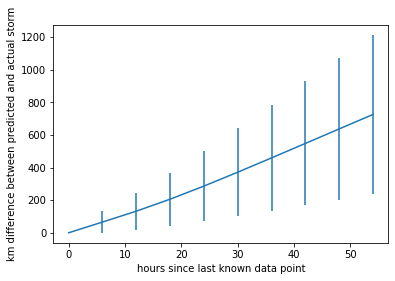

In [112]:
plt.errorbar(range(0,60,6), rows1.mean().values, yerr= rows1.std())
plt.xlabel('hours since last known data point')
plt.ylabel('km difference between predicted and actual storm')

In [117]:
#case of temperature data excluded
rows2= deviation(X, modelLon2,modelwind2,modelLat2,modelSLP2,includeTemp=False)

Text(0, 0.5, 'km difference between predicted and actual storm')

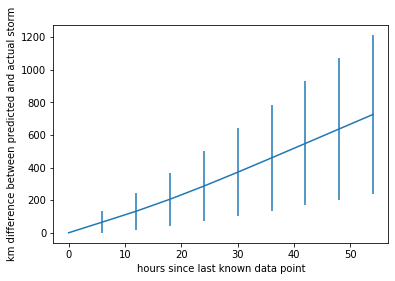

In [118]:
plt.errorbar(range(0,60,6), rows2.mean().values, yerr= rows2.std())
plt.xlabel('hours since last known data point')
plt.ylabel('km difference between predicted and actual storm')

Text(0, 0.5, 'difference between km deviations')

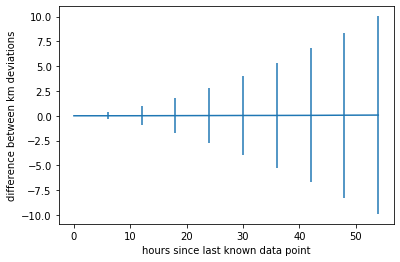

In [121]:
# difference between the case of including and excluding temperature
rows3=rows1.subtract(rows2)

plt.errorbar(range(0,60,6), rows3.mean().values, yerr= rows3.std())
plt.xlabel('hours since last known data point')
plt.ylabel('difference between km deviations')

# neural network model

In [122]:
#define variables
x_train = oldX.iloc[:,1:]
x_train = np.asarray(x_train)

#scale y values
y_trainLat = np.divide(df5['ylat'], 90)
y_trainLon = np.divide(df5['ylon'], 600)
y_trainWind = np.divide(df5['wind'], 100)
y_trainSLP=np.divide(np.subtract(df5['SLP'], 900), 120)

#combine y's to one array
y_train2 = np.asarray([y_trainLat,y_trainLon,y_trainWind,y_trainSLP]).T

In [123]:
#reference: code adapted from SML 310 course files

activation = 'relu'

def model2(x_train, y_train): 
    inputs = keras.Input(shape=(10,), name="inputs")
    
    #define neural network layers
    x = layers.Dense(64, activation=activation, name="dense_1")(inputs)
    x = layers.Dense(32, activation=activation, name="dense_2")(x)
    x = layers.Dense(64, activation=activation, name="dense_3")(x)
    x = layers.Dense(32, activation=activation, name="dense_4")(x)
    x = layers.Dense(64, activation=activation, name="dense_6")(x)
    x = layers.Dense(32, activation=activation, name="dense_5")(x)
    outputs = layers.Dense(4, activation='linear', name="predictions")(x)
    model = keras.Model(inputs=inputs, outputs=outputs)

    #compile the model 
    model.compile(
        optimizer=keras.optimizers.RMSprop(learning_rate = 0.001),  # Optimizer
        # Loss function to minimize
        loss=keras.losses.MeanSquaredError(),
        # List of metrics to monitor
        metrics=[keras.metrics.MeanSquaredError()],
    )
    #split training data into validation and training components
    x_val = x_train[-10000:]
    y_val = y_train[-10000:]
    x_train = x_train[:-10000]
    y_train = y_train[:-10000]

    #fit model with training data and validate
    print("Fit model on training data")
    history = model.fit(
        x_train,
        y_train,
        batch_size=32,
        epochs=20,
        validation_data=(x_val, y_val),
    )

    return model

In [124]:
#train the model on data
model6= model2(x_train, y_train2)



Fit model on training data
Train on 121874 samples, validate on 10000 samples
Epoch 1/20
121874/121874 [==============================] - 5s 40us/sample - loss: 0.6934 - mean_squared_error: 0.6934 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 2/20
121874/121874 [==============================] - 4s 34us/sample - loss: 0.0020 - mean_squared_error: 0.0020 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 3/20
121874/121874 [==============================] - 4s 34us/sample - loss: 0.0014 - mean_squared_error: 0.0014 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 4/20
121874/121874 [==============================] - 4s 35us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 9.7909e-04 - val_mean_squared_error: 9.7909e-04
Epoch 5/20
121874/121874 [==============================] - 4s 34us/sample - loss: 0.0010 - mean_squared_error: 0.0010 - val_loss: 9.3091e-04 - val_mean_squared_error: 9.3091e-04
Epoch 6/20
121874/121874 [=========================

In [134]:
#save model
# model6.save('home/gkortum/')
#load saved model
# model6 = keras.models.load_model('home/gkortum/')

Text(0.5, 0, 'epoch')

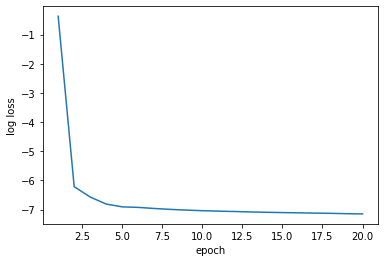

In [133]:
#plot loss over epochs: 

losses = [0.69,0.002,0.0014,0.0011,0.001,0.000982,0.000946,0.000917,0.000895,0.000877,0.000863,0.000853,0.00084,0.00083,0.000822,0.000815,0.0008067, 0.0008009,0.000791,0.000785]
plt.plot(range(1,21,1),np.log(losses))
plt.ylabel('log loss')
plt.xlabel('epoch')

# generate predictions
Iteratively produce predicted tracks, as was done with the regression model. 

In [135]:
#generate predicted tracks from X and the model
def predict3(X, model2):
    X_pred = []
    for i in range(X.shape[0]):
        #first point in a storm
        if X['XCOUNT'].values[i]==2:
            firstPoint = list(X.iloc[i,:].values)
            X_pred.append(firstPoint)
        else: 
            #get values of two time steps before
            lon2 = X_pred[-1][5-1]
            wind2= X_pred[-1][6-1]
            lat2= X_pred[-1][7-1]
            SLP2= X_pred[-1][8-1]
            a = X_pred[-1]

            #predictions from the model, scaled
            a = np.float32(np.asarray(a).reshape(1,10))
            lat = np.multiply(model2.predict(a)[0][0],90)
            lon = np.multiply(model2.predict(a)[0][1],600)
            wind = np.multiply(model2.predict(a)[0][2],100)
            SLP = np.add(np.multiply(model2.predict(a)[0][3], 120),900)

            XCOUNT = X_pred[-1][9-1]+1
            meanTemp = X_pred[-1][10-1]
           
            X_pred.append([lon2,wind2,lat2,SLP2,lon,wind,lat,SLP,XCOUNT,meanTemp])
            
    #format the predictions dataframe
    predicted = pd.DataFrame(X_pred)
    predicted.columns = X.columns
    shape = predicted.shape[0]

    predicted['year']= df5['year'].values[0:shape]
    predicted['ensemble']=df5['ensemble'].values[0:shape]
    return predicted

In [179]:
#predicted values for first 10000 data points 
predictednn=predict3(oldX.iloc[0:20000,1:], model6)

# visualize predicted tracks

<Figure size 432x288 with 0 Axes>

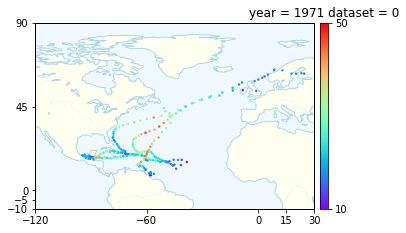

<Figure size 432x288 with 0 Axes>

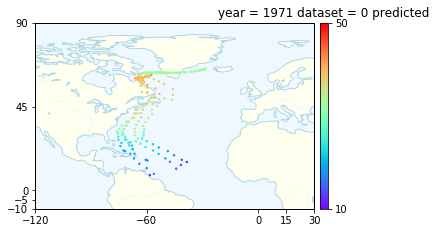

<Figure size 432x288 with 0 Axes>

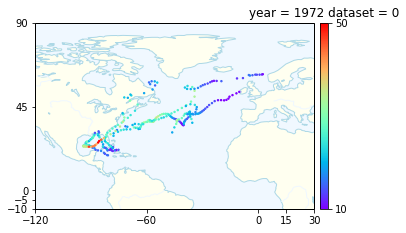

<Figure size 432x288 with 0 Axes>

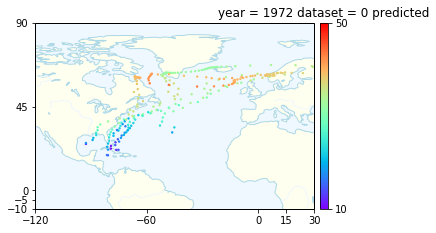

<Figure size 432x288 with 0 Axes>

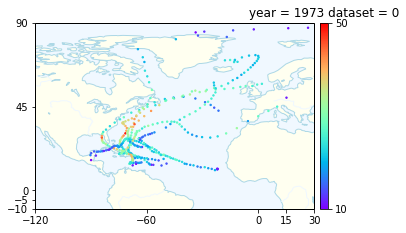

<Figure size 432x288 with 0 Axes>

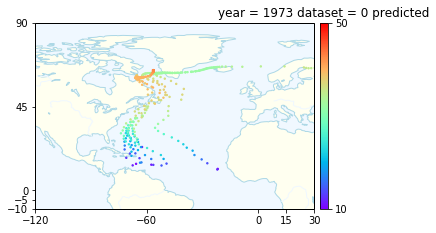

<Figure size 432x288 with 0 Axes>

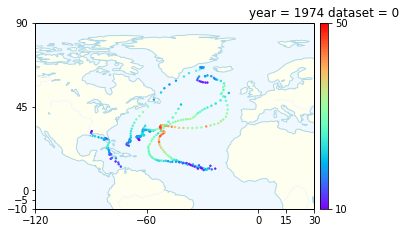

<Figure size 432x288 with 0 Axes>

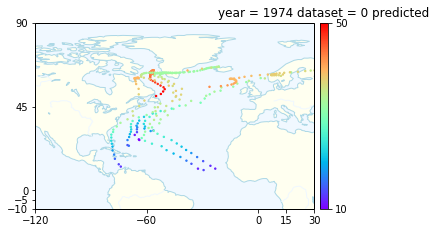

<Figure size 432x288 with 0 Axes>

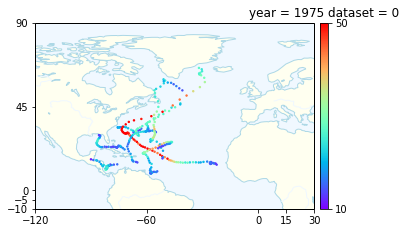

<Figure size 432x288 with 0 Axes>

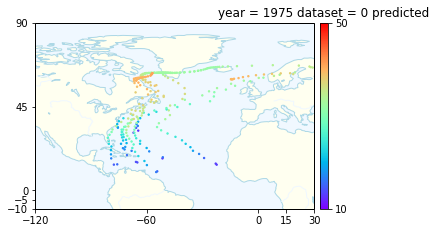

<Figure size 432x288 with 0 Axes>

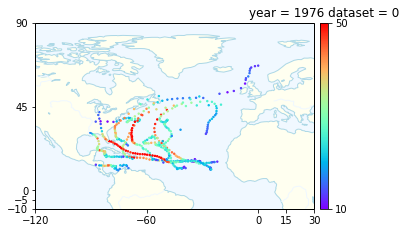

<Figure size 432x288 with 0 Axes>

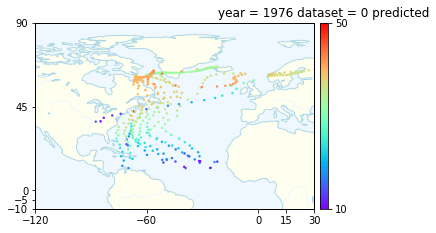

<Figure size 432x288 with 0 Axes>

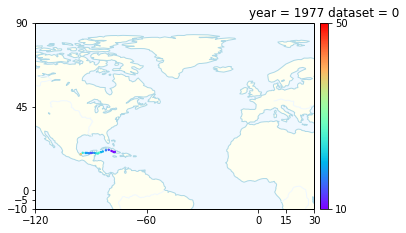

<Figure size 432x288 with 0 Axes>

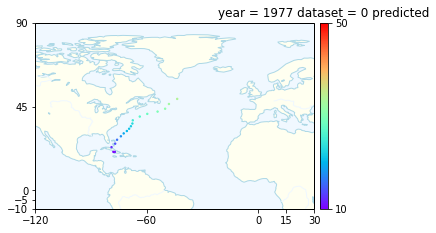

<Figure size 432x288 with 0 Axes>

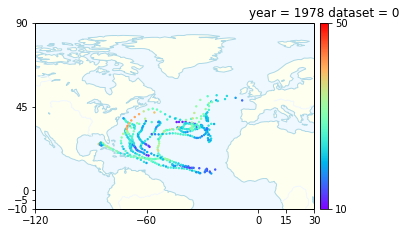

<Figure size 432x288 with 0 Axes>

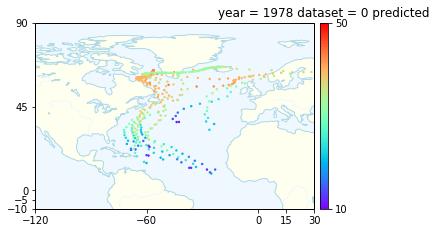

<Figure size 432x288 with 0 Axes>

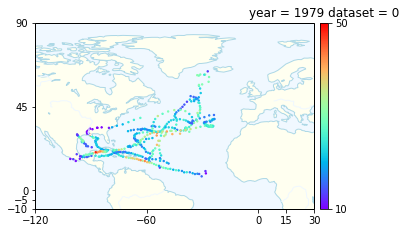

<Figure size 432x288 with 0 Axes>

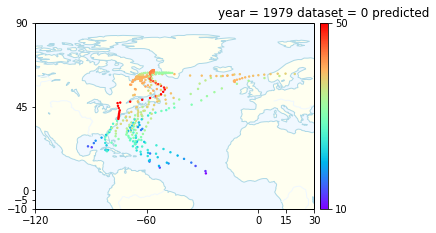

<Figure size 432x288 with 0 Axes>

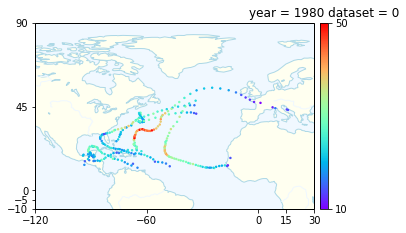

<Figure size 432x288 with 0 Axes>

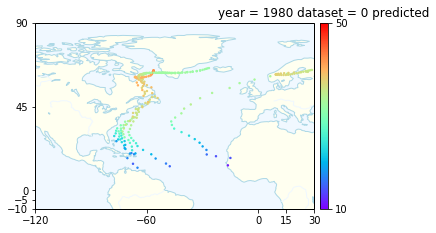

<Figure size 432x288 with 0 Axes>

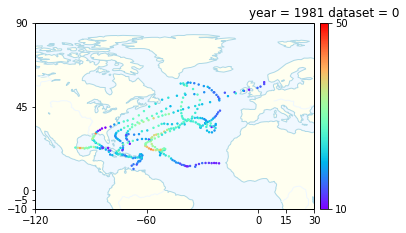

<Figure size 432x288 with 0 Axes>

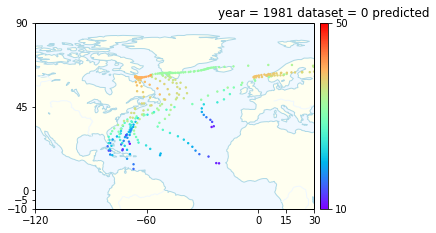

<Figure size 432x288 with 0 Axes>

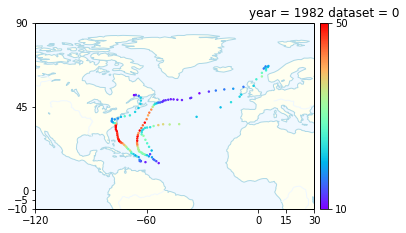

<Figure size 432x288 with 0 Axes>

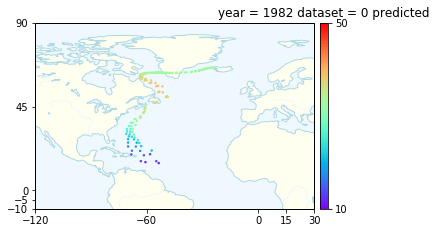

<Figure size 432x288 with 0 Axes>

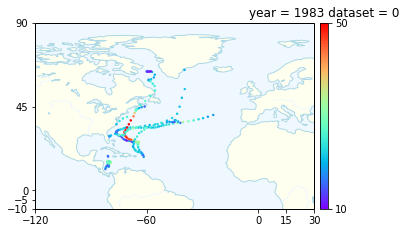

<Figure size 432x288 with 0 Axes>

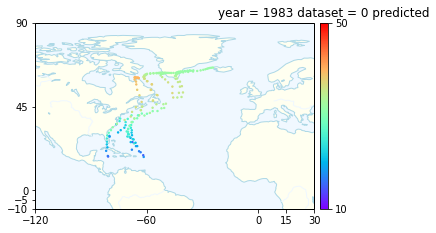

<Figure size 432x288 with 0 Axes>

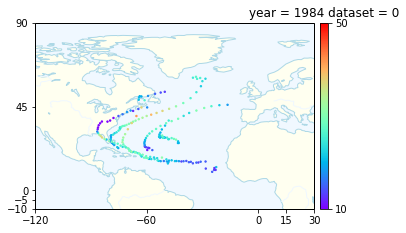

<Figure size 432x288 with 0 Axes>

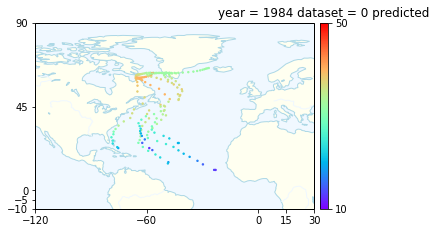

<Figure size 432x288 with 0 Axes>

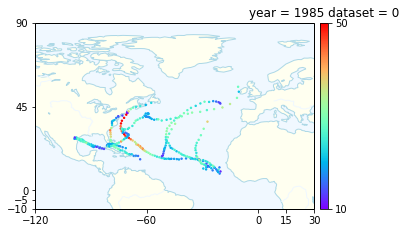

<Figure size 432x288 with 0 Axes>

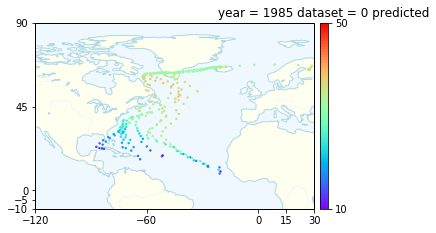

<Figure size 432x288 with 0 Axes>

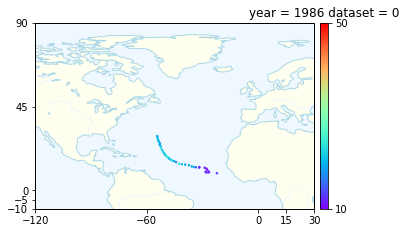

<Figure size 432x288 with 0 Axes>

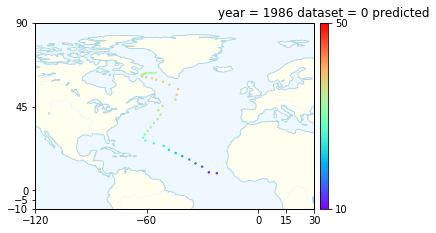

<Figure size 432x288 with 0 Axes>

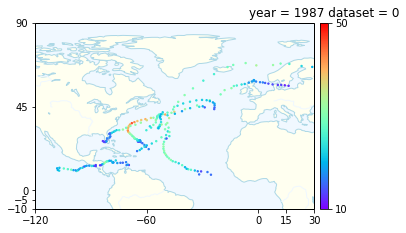

<Figure size 432x288 with 0 Axes>

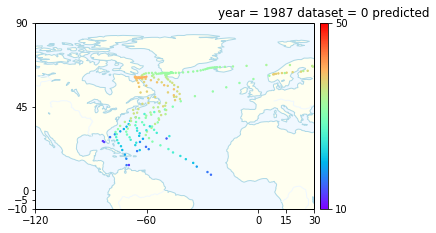

<Figure size 432x288 with 0 Axes>

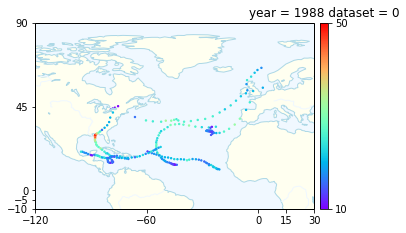

<Figure size 432x288 with 0 Axes>

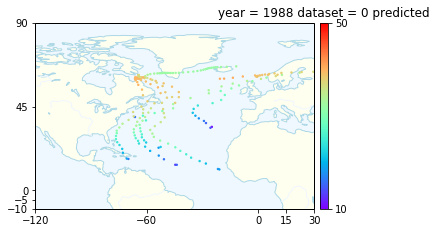

<Figure size 432x288 with 0 Axes>

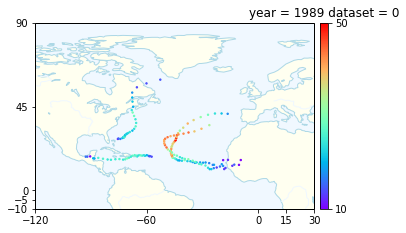

<Figure size 432x288 with 0 Axes>

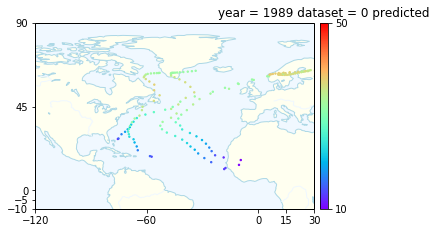

<Figure size 432x288 with 0 Axes>

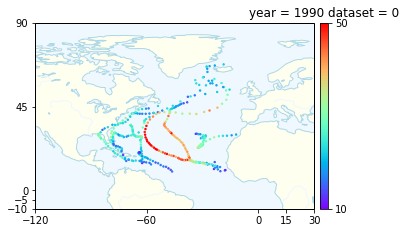

<Figure size 432x288 with 0 Axes>

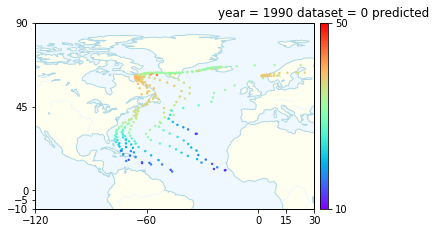

<Figure size 432x288 with 0 Axes>

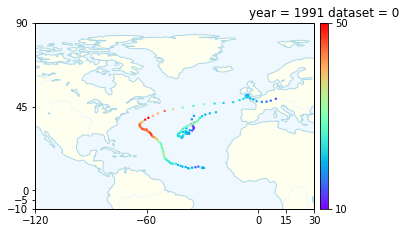

<Figure size 432x288 with 0 Axes>

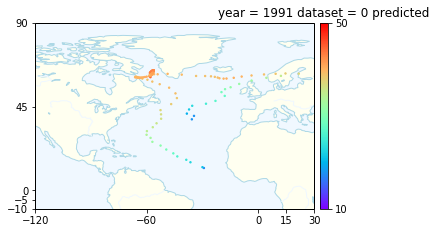

<Figure size 432x288 with 0 Axes>

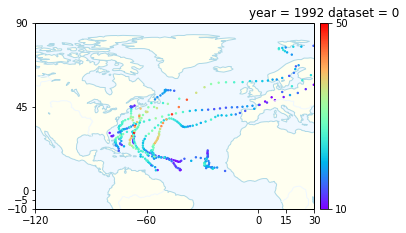

<Figure size 432x288 with 0 Axes>

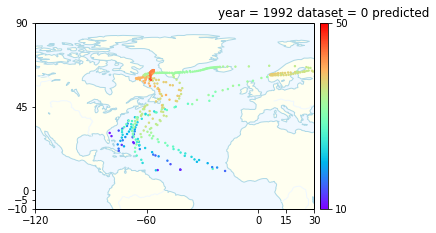

<Figure size 432x288 with 0 Axes>

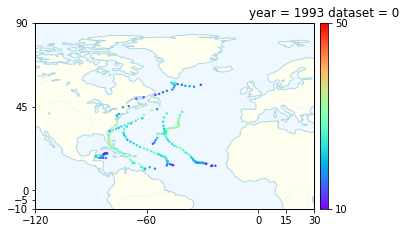

<Figure size 432x288 with 0 Axes>

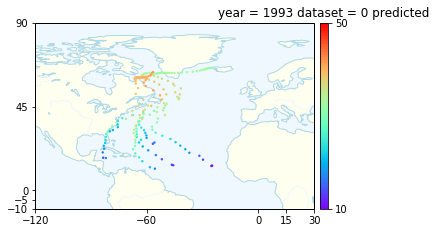

<Figure size 432x288 with 0 Axes>

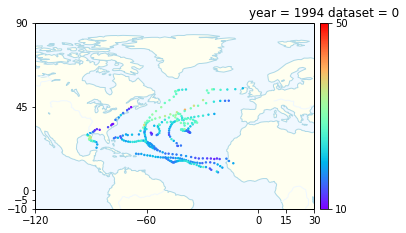

<Figure size 432x288 with 0 Axes>

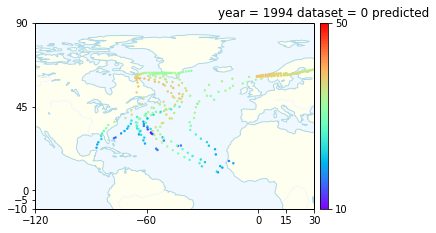

<Figure size 432x288 with 0 Axes>

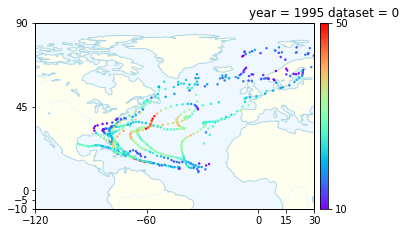

<Figure size 432x288 with 0 Axes>

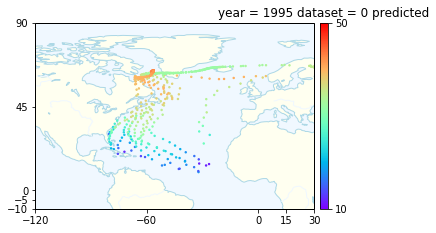

<Figure size 432x288 with 0 Axes>

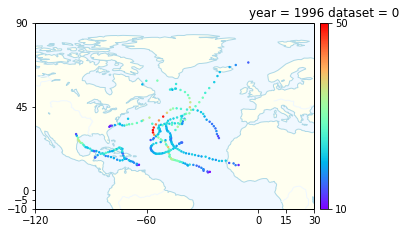

<Figure size 432x288 with 0 Axes>

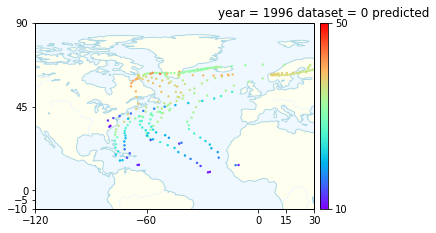

<Figure size 432x288 with 0 Axes>

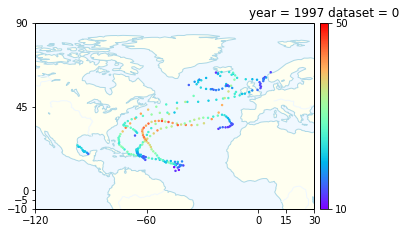

<Figure size 432x288 with 0 Axes>

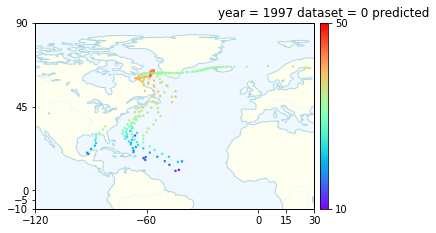

<Figure size 432x288 with 0 Axes>

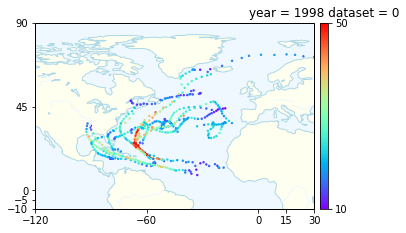

<Figure size 432x288 with 0 Axes>

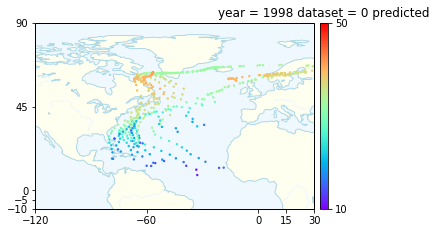

<Figure size 432x288 with 0 Axes>

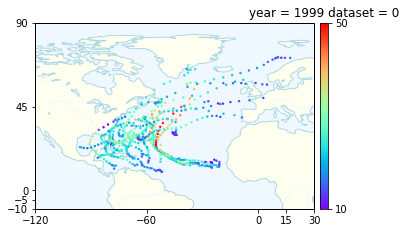

<Figure size 432x288 with 0 Axes>

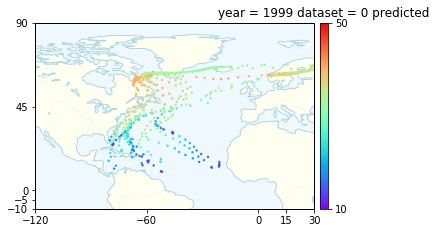

<Figure size 432x288 with 0 Axes>

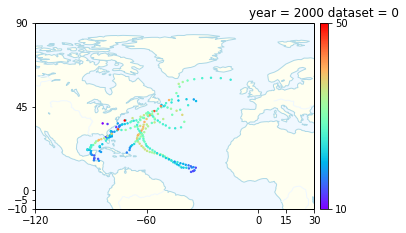

<Figure size 432x288 with 0 Axes>

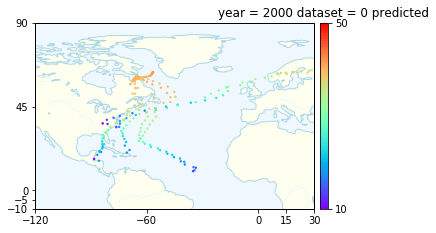

<Figure size 432x288 with 0 Axes>

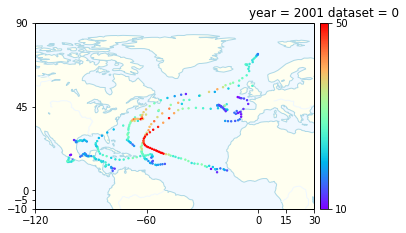

<Figure size 432x288 with 0 Axes>

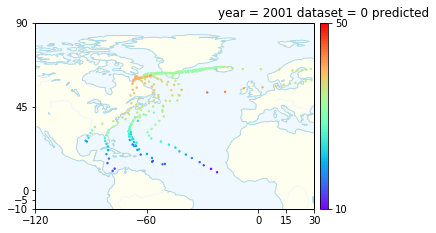

<Figure size 432x288 with 0 Axes>

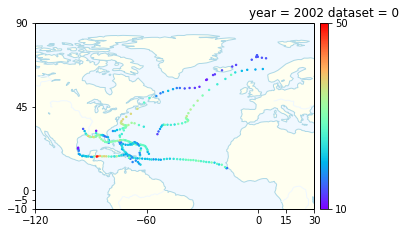

<Figure size 432x288 with 0 Axes>

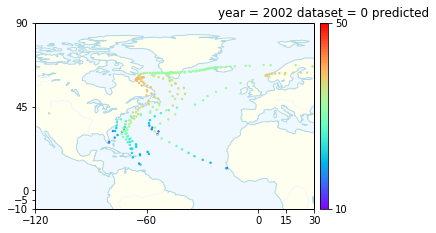

<Figure size 432x288 with 0 Axes>

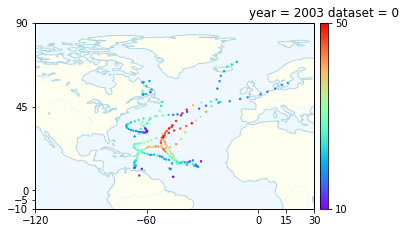

<Figure size 432x288 with 0 Axes>

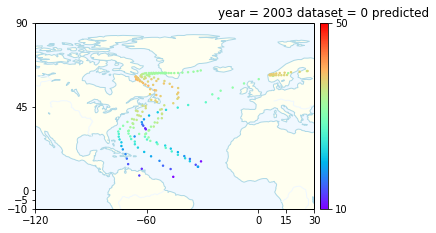

<Figure size 432x288 with 0 Axes>

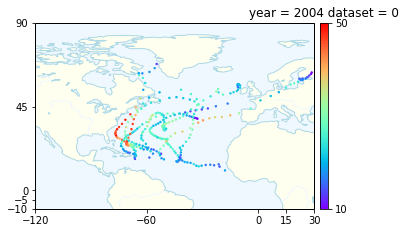

<Figure size 432x288 with 0 Axes>

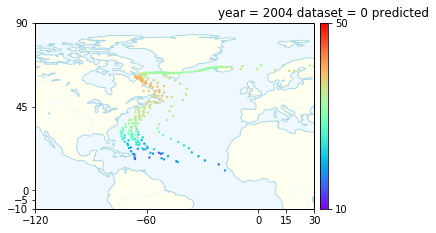

<Figure size 432x288 with 0 Axes>

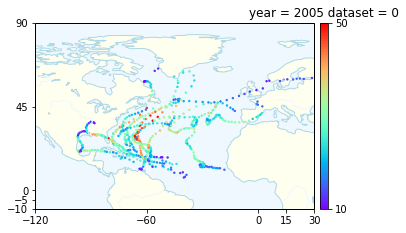

<Figure size 432x288 with 0 Axes>

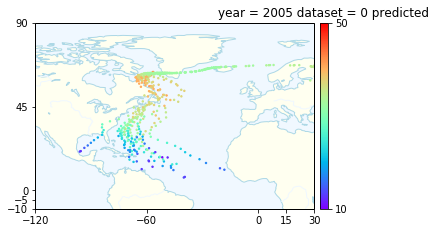

<Figure size 432x288 with 0 Axes>

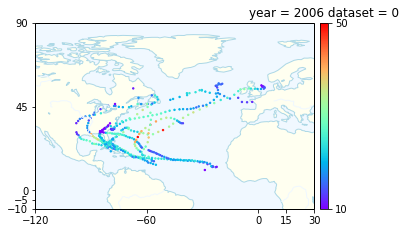

<Figure size 432x288 with 0 Axes>

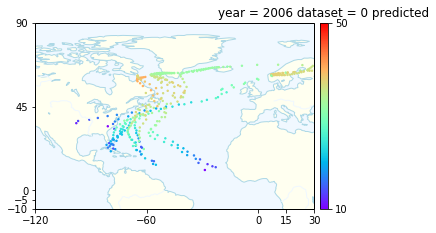

<Figure size 432x288 with 0 Axes>

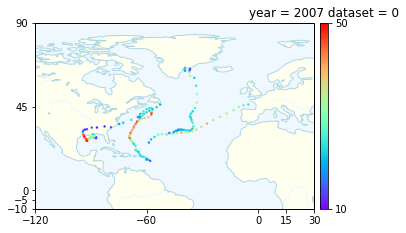

<Figure size 432x288 with 0 Axes>

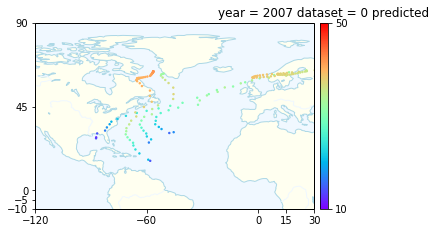

<Figure size 432x288 with 0 Axes>

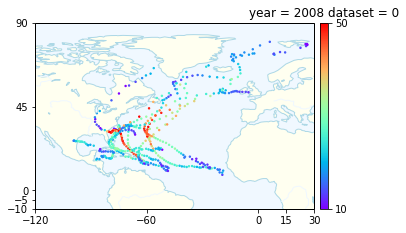

<Figure size 432x288 with 0 Axes>

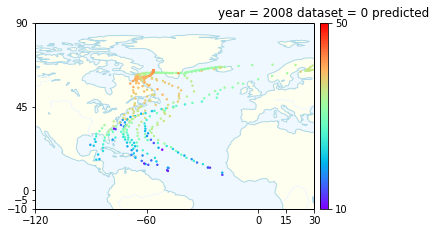

<Figure size 432x288 with 0 Axes>

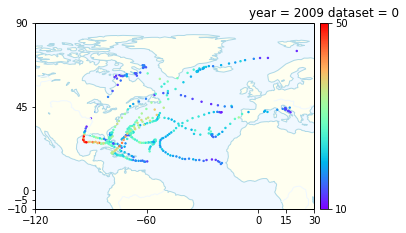

<Figure size 432x288 with 0 Axes>

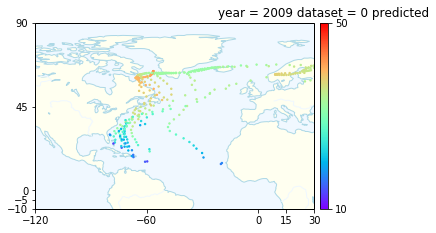

<Figure size 432x288 with 0 Axes>

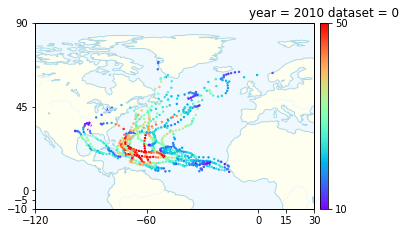

<Figure size 432x288 with 0 Axes>

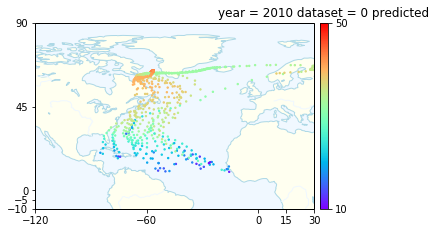

<Figure size 432x288 with 0 Axes>

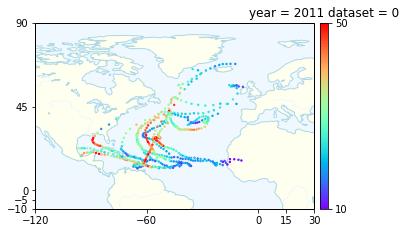

<Figure size 432x288 with 0 Axes>

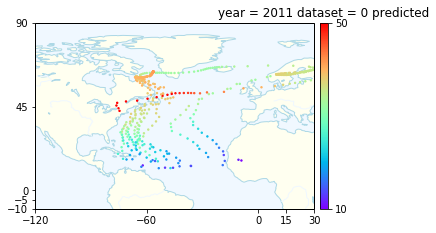

<Figure size 432x288 with 0 Axes>

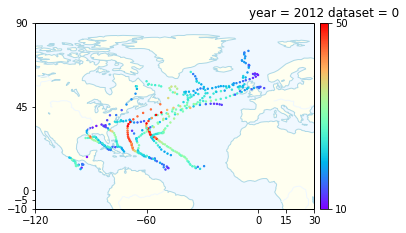

<Figure size 432x288 with 0 Axes>

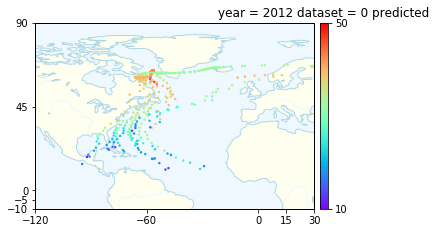

<Figure size 432x288 with 0 Axes>

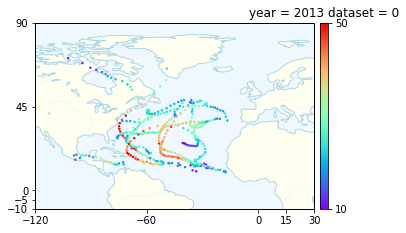

<Figure size 432x288 with 0 Axes>

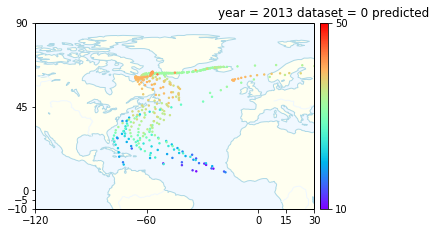

<Figure size 432x288 with 0 Axes>

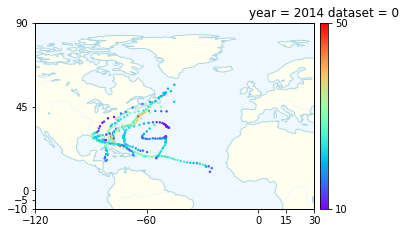

<Figure size 432x288 with 0 Axes>

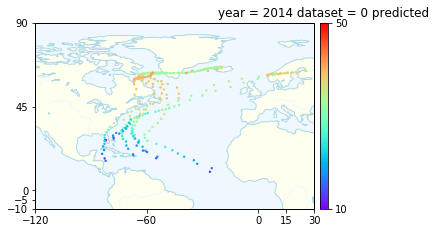

<Figure size 432x288 with 0 Axes>

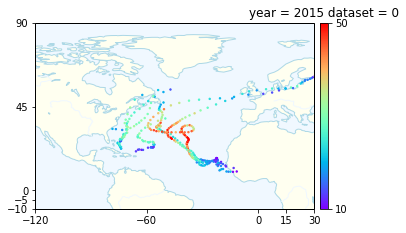

<Figure size 432x288 with 0 Axes>

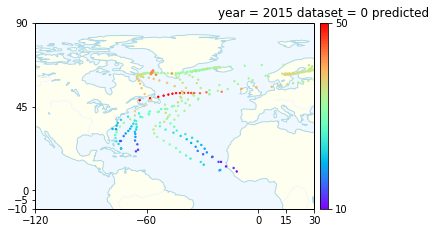

<Figure size 432x288 with 0 Axes>

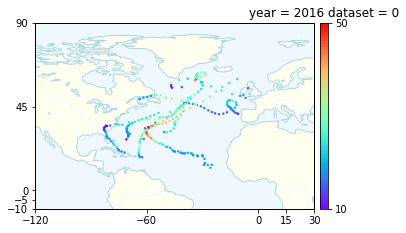

<Figure size 432x288 with 0 Axes>

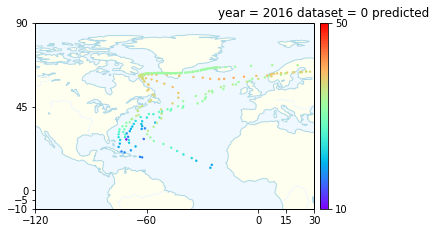

<Figure size 432x288 with 0 Axes>

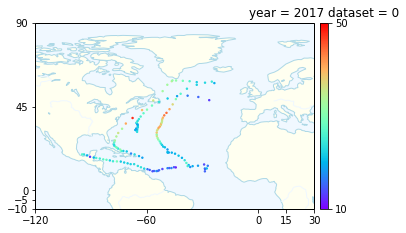

<Figure size 432x288 with 0 Axes>

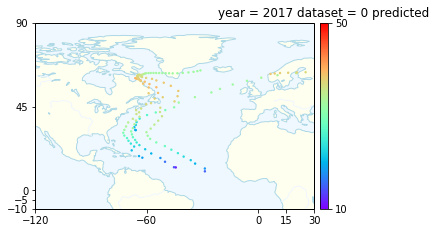

<Figure size 432x288 with 0 Axes>

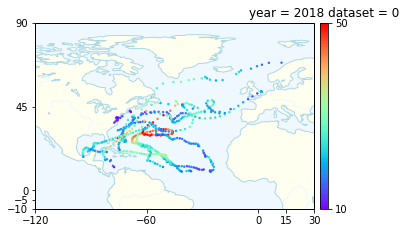

<Figure size 432x288 with 0 Axes>

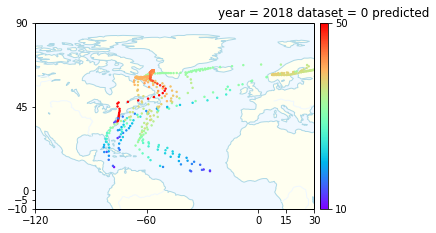

<Figure size 432x288 with 0 Axes>

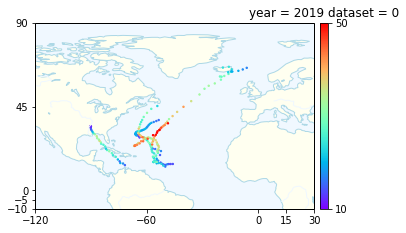

<Figure size 432x288 with 0 Axes>

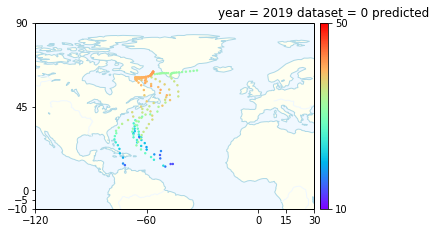

In [180]:
plot_tracks(predictednn, df5)

# assess model performance

Model performance is assessed in the same way as it was for the regression model. However, here, only the first 100 storms are investigated due to slow run times. 

In [185]:
def deviation2(X, model):
    stormID=[]

    theCount =0
    timesince =0

    #keep track of the separate storms in X
    for i in X['XCOUNT'].values:
        if i ==2: 
            theCount+=1
        stormID.append(theCount)
    Xmany = X.copy()
    Xmany['stormID']=stormID

    #keep track of the length of each storm in X
    stormlengths = Xmany.groupby('stormID').count()['const'].values
    stormLength=[]
    for i in stormID:
         stormLength.append(stormlengths[i-1])
    Xmany['length']=stormLength
    
    #remove interaction terms
    Xmany2=Xmany.copy()
    Xmany2 = Xmany2.iloc[:,1:-6]
    Xmany2['stormID']= Xmany['stormID']
    Xmany2['length']= Xmany['length']
    Xmany2['meanTemp']= df5['meanTemp'].values
    Xmany = Xmany2.copy()

    timeframe = 10
    latpred = []
    lonpred=[]
    latreal2=[]
    lonreal2=[]

    nstorms = 100
    #iterate through the storms
    for thestorm in range(1,nstorms+1,1):
        Xdrop= Xmany[Xmany['stormID']==thestorm]
        length=Xdrop['length'].values[0]
        shifts = length-timeframe+1
        X_pred = []
        #shift the starting position in the storm
  
        for s in range(shifts): 
            #set up for the prediction, collect starting points
            latsList =[]
            lonsList =[]
            latsList2 =[]
            lonsList2 =[]
    
            latsList.append(Xdrop['lat'].values[s])
            lonsList.append(Xdrop['lon'].values[s])
         
            first = Xdrop.iloc[s,:-6]
            first['XCOUNT']=Xdrop.iloc[s,-2]
            first['meanTemp']=Xdrop.iloc[s,-1]
            firstPoint = list(first.values)

            latsList2.append(Xdrop['lat'].values[s])
            lonsList2.append(Xdrop['lon'].values[s])
            X_pred.append(firstPoint)
            
            # build out the predicted tracks from time step 1 to 10
            for m in range(timeframe-1):
                
                latsList2.append(Xdrop['lat'].values[s+m+1])
                
                lonsList2.append(Xdrop['lon'].values[s+m+1])
          
                a = np.asarray(X_pred[-1]).reshape(1,-1)
                lon2 = X_pred[-1][5-1]
                wind2= X_pred[-1][6-1]
                lat2= X_pred[-1][7-1]
                SLP2= X_pred[-1][8-1]
                a = X_pred[-1]

                a = np.float32(np.asarray(a).reshape(1,10))
   

                lat = np.multiply(model6.predict(a)[0][0],90)
                lon = np.multiply(model6.predict(a)[0][1],600)

                wind = np.multiply(model6.predict(a)[0][2],100)

                SLP = np.add(np.multiply(model6.predict(a)[0][3], 120),900)
                lonsList.append(lon)
          
                latsList.append(lat)

                XCOUNT = X_pred[-1][9-1]+1
                meanTemp = X_pred[-1][10-1]
                toAppend = np.asarray([lon2,wind2,lat2,SLP2,lon,wind,lat,SLP,XCOUNT, meanTemp])

                X_pred.append(list(toAppend))
            latpred.append(latsList)
            lonpred.append(lonsList)

            latreal2.append(latsList2)
            lonreal2.append(lonsList2)

    #convert to pandas
    latpred3=pd.DataFrame(np.asarray(latpred))
    lonpred3=pd.DataFrame(np.asarray(lonpred))
    latreal3=pd.DataFrame(np.asarray(latreal2))
    lonreal3=pd.DataFrame(np.asarray(lonreal2))



    #replace predicted values above 90 with 90
    latpred3=np.asarray(latpred3)
    toreplace=90*np.ones(latpred3.shape)
    latpred3=np.minimum(latpred3,toreplace)
    latpred3=pd.DataFrame(latpred3)


    #calculate distances between predicted and actual coordinates
    rows=[]
    for i in range(latpred3.shape[0]):

        cols =[]
        for j in range(latpred3.shape[1]):

            coords_p = (latpred3.iloc[i,j], lonpred3.iloc[i,j])
            coords_r = (latreal3.iloc[i,j], lonreal3.iloc[i,j])

            cols.append(geopy.distance.distance(coords_p, coords_r).km)
        rows.append(cols)


    rows=pd.DataFrame(np.asarray(rows))

    return rows

In [186]:
rowsnn=deviation2(Xmany, model6)

Text(0, 0.5, 'km difference between predicted and actual storm')

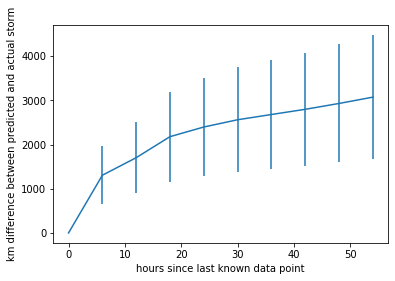

In [190]:

plt.errorbar(range(0,60,6), rowsnn.mean().values, yerr= rowsnn.std())
plt.xlabel('hours since last known data point')
plt.ylabel('km difference between predicted and actual storm')